# CS145: Project 2 - Data Science | <Make a good title>

Do **NOT** run this notebook!

This notebook was executed through Google Colab and BigQuery and authentication
information has been removed. This notebook was simply provided as a project
summary.

# Project Set-up

In [1]:
# Run this cell to authenticate yourself to BigQuery
from google.colab import auth
auth.authenticate_user() # make sure to "Select All" when authenticating
project_id = "..redacted.."

In [2]:
# Initialize BiqQuery client
from google.cloud import bigquery
client = bigquery.Client(project=project_id)

In [4]:
# Loading Python Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pandas as pd
%matplotlib inline
sns.set_theme()

# Section 1: Project Overview

---

This project is a continuation of Songyu Han's ~award winning~ Project 1 with a significant focus on the relationship between air pollution and geography, climate and travel patterns.

We aim to extend our analysis and address some limitations of our Project 1 by incorporating data science tools and procedures, and we wish to specifically answer the following key questions:

* Is EPA's historical air quality dataset a representative sample? Are there significant spatial or temporal clusters / gaps in the dataset?

* What are the seasonal trends in air pollution hazards? Are these trends different for various geographical regions?

* Is air pollution related to poor health care outcomes, high travel traffic, or climate?

* Can we accurately predict air pollution hazards from climate and weather indicators?

To answer these questions to the best of our abilities, we will use a mix of BigQuery SQL, advanced data visualization and machine learning models.

---

# Section 2: Datasets and Table Relations

---

## Section 2.1: Dataset Summary:

Our analysis will utilize 4 datasets: 2 from BigQuery Public Data and 2 external datasets. The BigQuery Datasets are multi-table, so the row and size statistics will be reported in rough estimates per table.

| Dataset Name | Rows per Table | Size per Table | Date Coverage | Description |
| --- | --- | --- | --- | --- |
| EPA Air Quality$^1$ | 5 - 12 Million | 1.5 - 3.7 GB | 1997 - 2025 | A large scale dataset from the Environmental Protection Agency documenting daily and hourly measurements of air pollutants across stations in the US. |
| NOAA GSOD | 2 - 4 Million | $\ge$ 400 MB | 1929 - 2025$^2$ | The Global Surface Summary of the Day dataset from NOAA containing records of 18 surface meteorological elements. |
| [EXT] T-100 Segment | 6.9 Million | 380 MB | 2010 - 2024 | A dataset from the Bureau of Transportation Statistics with montly passenger counts for all direct flight segments originating or terminating at US airports. |
| [EXT] Social Deprivation Index | 3,142 | 372 KB | 2015-2019 | Provides county-level summaries of Socio-Economic Status (SES) computed using indicators provided by the American Community Survey on a 5-year rolling average. |

Notes:
1. We will be using the Daily Summary tables in the EPA Air Quality Dataset.
2. The GSOD dataset is organized with 1 table per year with all measurements, while the EPA dataset is organized by 1 table per pollutant for all years. Measurements before 1980 in the NOAA dataset are sparse but are less relevant to our studies.

## Section 2.2: Dataset and Table Descriptions:

### 2.2.1 EPA Historical Air Quality:

This was the dataset used in one team member's Project 1 and will be the primary dataset for this project as well. We will continue to use the `daily_summary` tables, which all follow the [DMCSV](https://aqs.epa.gov/aqsweb/documents/DMCSV_Format.html) format and thus have similar schema.

* `(state_code, county_code, site_num)` - Unique identifier for each measurement site $^1$
* `(latitude, longitude)` - Location Coordinates for each measurement site
* `(state_name, county_name, city_name)` - Human Readable names for measurement site locations
* `date_local` - Measurement date $^2$
* `(sample_duration, pollutant_standard)` - Measurement type & procedure identifier $^{3,4}$
* `(arithmetic_mean, first_max_value)` - Daily average and maximum readings

Notes:
1. `state_code` and `county_code` can be concatenated to obtain the county-level FIPS code.
2. There might be multiple rows that share identical`(state_code, county_code, site_num, date_local)` since the same air quality metric may be recorded through multiple instruments on the same site.
3. We can use the `NULL` values in the `pollutant_standard` column to identify records corresponding to non-standard measurements. Typically, these rows will be dropped during our data analysis.
4. Some `sample_duration` values may refer to the same measuring methodology. (Such as "24 HOUR" and "24-HR BLK AVG" for PM2.5)  

### 2.2.2 NOAA Surface Summary of the Day:

Though the EPA provides limited meterological data, (temperature, wind, surface pressure etc.) more advanced analysis between air quality and weather requires a more exhaustive dataset. NOAA provides a GSOD dataset with the following table columns:

* `(stn, wban)` - Unique identifier for each measuring station
* `(year, mo, da)` - Numeric strings indicating the date of the measurement
* `(min, temp, max)` - Minimum, average and maximum temperature during the day
* `(wdsp, gust)` - Average and maximum wind speed during the day
* `prcp` - Total precipitation during the day
* `(stp, slp)` - Average station or adjusted sea-level pressure during the day
* `(fog, rain_drizzle, hail, thunder, ...)` - Binary indicators for specific weather events

We noticed that the NOAA follows a different convention of reporting missing or insufficient data. Rather than using `NULL` or `0.0` as default values, NOAA reports missing data as `9999`, `999.9`, `99.99`... The default value for missing data varies for different metrics.

The dataset also includes a `stations` lookup table:

* `(usaf, wban)` - Unique identifier for each measuring station (**`JOIN` key**)
* `country` - Country of station
* `(lat, long)` - Location for each station

The tuple `(usaf, wban)` functions as a primary key for this table since all pairs are distinct and non-`NULL`.

### 2.2.3 T-100 Segment:

This dataset was sourced from the [Bureau of Transportation Statistics](https://transtats.bts.gov/Fields.asp?gnoyr_VQ=FMG) (BTS). We have coalesced the records from 2010 to 2024 (15 years) in a single table that provides monthly passenger summaries for flights originating or terminating at a US airport. This table will be used to study the potential relationship between air traffic and air pollution. The schema of this table is provided below, and we have slightly adjusted the column names to better facilitate multi-table analysis.

* `(carrier_id, carrier)` - Code and name for the airline
* `(origin, dest)` - Airport code for the origin and destination for each flight segment
* `(year, month)` - Each record's time window
* `flights` - Number of flights performed by a specific carrier for a specific city pair within the month.
* `passengers` - The number of passengers performed by a specific carrier for a specific city pair within the month. $^1$

Note:
1. Rows with `passengers` = 0 indicate cargo flights. Rows with `flights` = 0 indicate scheduled flights recorded by the BTS that weren't performed by the airline.

<!-- 3. The T-100 Segment data provides a more accurate count for the number of passenger transported at each airport thant the T-100 Market data. (eg. A passenger on board a flight `SFO to LGA via ORD` will be counted only once as `SFO -> LGA` on the market data, but the segment data counts both `SFO -> ORD` and `ORD -> LGA` as two separate records.) -->

### 2.2.4 Social Deprivation Index:

We also included a Social Deprivation Index (SDI) dataset to enable studying a potential relationship between air pollution and public health. The SDI is a county-level summary statistic that "quantify levels of disadvantage across small areas, evaluate their associations with health outcomes, and address health inequities." ([source](https://www.graham-center.org/maps-data-tools/social-deprivation-index.html))

 Compared to other socio-economic summaries such as the ADI (Area Deprivation Index, a more "general-use" metric) or the SVI (Social Vulnerability Index, a metric specializes in "responses to hazardous events"), the SDI is a more public health oriented metric and thus the most suitable out of the three for our analysis. ([source](https://www.sciencedirect.com/science/article/pii/S1600613522292879))

Key columns in the SDI tables include:

* `fips` - County FIPS code (**Primary Key**)
* `population` - County Population Estimate (2015)
* `sdi_score` - County SDI Percentile (1 - 100)
* `sdi` - Raw SDI index value

There are also raw values and percentile scores for each SDI component in this dataset, which we likely won't utilize. We found no `NULL` values in this table.


## Section 2.3: Table Relations:

Our SDI dataset can be easily related to our primary EPA dataset via **county FIPS codes**.

However, relating our EPA dataset to the T-100 airport data will be much more challenging, since they have no common keys and thus cannot be directly joined. As such, we have prepared an airport lookup table by combining two airport repositories. ([1](https://geodata.bts.gov/datasets/usdot::aviation-facilities/about), [2](https://github.com/lxndrblz/Airports)) Our preliminary analysis found that the BTS uses a mix of IATA code and FAA Location Identifier (LID) for airports, but this should not be a major problem in our analysis since almost all US airports with significant passenger traffic share identical IATA and LID.

The airport lookup table has 20,009 rows and key columns `code` (primary key), `state_name` and `county_name`. We have ensured that these three columns do not contain `NULL`. The following example query demonstrates the feasibility of this join by providing the montly average AQI at LAX (Los Angeles Intl.) during its busiest month from 2010 to 2019.

In [5]:
%%bigquery --project $project_id
/*
Demonstrates the feasibility of joining EPA and T-100 data via our lookup table

Key Tools: Window Functions, CTE, OUTER JOIN

Estimated Quota: 525 MB
*/

-- First compute the LAX departure traffic and arrival traffic
WITH lax_dep AS(
  SELECT origin AS apt, year, month, SUM(passengers) AS dep_traffic
  FROM `cs145-474518.cs145_project_main.t100`
  WHERE origin = "LAX" AND year >= 2010 AND year < 2020
  GROUP BY origin, year, month
),
lax_arr AS(
  SELECT dest AS apt, year, month, SUM(passengers) AS arr_traffic
  FROM `cs145-474518.cs145_project_main.t100`
  WHERE dest = "LAX" AND year >= 2010 AND year < 2020
  GROUP BY dest, year, month
),
-- Join the two tables for the full passenger traffic
lax_traffic AS(
  SELECT d.apt, d.year, d.month, IFNULL(a.arr_traffic, 0) + IFNULL(d.dep_traffic, 0) AS traffic
  FROM lax_dep d
    FULL OUTER JOIN lax_arr a
    ON d.apt = a.apt AND d.year = a.year AND d.month = a.month
),
-- Rank traffic, count ties
lax_busiest_traffic AS(
  SELECT apt, year, month, traffic, RANK() OVER (PARTITION BY apt, year ORDER BY traffic DESC) AS trank
  FROM lax_traffic
),
-- Joining with the lookup table to obtain county information
arpt_county AS(
  SELECT a.code, l.year, l.month, l.traffic, a.state_name, a.county_name
  FROM lax_busiest_traffic l
    JOIN cs145-474518.cs145_project_main.airport_lookup a
    ON l.apt = a.code
  WHERE l.trank = 1
),
-- Do some data cleaning for the EPA data first before joining with T-100
aqi_cleaned AS(
  SELECT date_local, state_name, county_name, AVG(aqi) AS aqi,
         EXTRACT(YEAR FROM date_local) AS year, EXTRACT(MONTH FROM date_local) AS month
  FROM `bigquery-public-data.epa_historical_air_quality.pm25_frm_daily_summary`
  WHERE
      (`sample_duration` IN ('24 HOUR'))   -- Only counting 24 hour measurements
      AND EXTRACT(YEAR FROM date_local) >= 2010
      AND EXTRACT(YEAR FROM date_local) <  2020
  GROUP BY date_local, state_name, county_name -- Aggregate county_level data
),
-- Compute the aqi monthly averages
aqi_monthly_avg AS(
  SELECT year, month, state_name, county_name, AVG(aqi) as aqi
  FROM aqi_cleaned
  GROUP BY state_name, county_name, year, month
)
-- Finally join the aqi data and the airport data
SELECT r.code, l.state_name, l.county_name, l.year, l.month, r.traffic, l.aqi
FROM aqi_monthly_avg l
  JOIN arpt_county r
    ON l.year = r.year AND l.month = r.month AND l.state_name = r.state_name AND l.county_name = r.county_name
ORDER BY l.year, l.month ASC

/*
July seems to consistently be the month with highest traffic at LAX...
Wonder if we will see high pollutant levels as well.
*/

Query is running:   0%|          |

Downloading:   0%|          |

,code,state_name,county_name,year,month,traffic,aqi
0,LAX,California,Los Angeles,2010,7,5739044.0,44.451524
1,LAX,California,Los Angeles,2011,7,6150472.0,43.526260
2,LAX,California,Los Angeles,2012,7,6213811.0,43.681951
3,LAX,California,Los Angeles,2013,7,6445548.0,41.637673
4,LAX,California,Los Angeles,2015,7,7201939.0,36.474347
5,LAX,California,Los Angeles,2016,7,7905417.0,43.792384
6,LAX,California,Los Angeles,2017,7,8067732.0,46.048835
7,LAX,California,Los Angeles,2018,7,8325479.0,43.097710
8,LAX,California,Los Angeles,2019,7,8297917.0,49.549632


The NOAA GSOD dataset has a similar issue where the tables cannot be joined with the EPA tables directly due to a lack of common keys. However, relating the two tables on the **county level** is possible via BigQuery's advanced geography features. NOAA provides the lat-long coordinates for each of their stations and BigQuery provides the geographic bounding boxes for all US counties in the `geo_us_bondaries.counties` table. Hence, we are able to attach county FIPS code via a `JOIN` that exploits BigQuery's `ST_GEOGPOINT` and `ST_CONTAINS` geography functions.

In [6]:
%%bigquery --project $project_id
/*
Creating the lookup table for NOAA station <--> US County relationship
This table will be saved under our big query project for future use.

Key Tools: Non-Equality JOIN, ST Geography Functions

Estimated Quota: 183 MB
*/

-- This will save a lookup table under our project.
CREATE OR REPLACE TABLE cs145-474518.cs145_project_main.noaa_lookup AS(
  -- Create a lat long geography point for all US NOAA stations
  WITH noaa_stn AS(
    SELECT usaf, wban, name, ST_GEOGPOINT(lon, lat) AS latlong
    FROM `bigquery-public-data.noaa_gsod.stations`
    WHERE country = "US"
  ),
  -- Select key columns from the geo_us_boundaries table (fips, bounding box)
  county_map AS(
    SELECT county_fips_code as fips, county_geom
    FROM `bigquery-public-data.geo_us_boundaries.counties`
  )
-- Creating our lookup table using custom JOIN
  SELECT l.usaf AS stn, l.wban, l.name, r.fips
  FROM noaa_stn l
    JOIN county_map r
      ON ST_CONTAINS(r.county_geom, l.latlong)
  ORDER BY r.fips ASC
)

Query is running:   0%|          |

""


We provide the following query computing the number of days in 2020 with both NOAA and EPA (PM 2.5) records for each US county to demonstrate the feasibility of joining the NOAA and EPA tables via our custom lookup table.

In [7]:
%%bigquery --project $project_id
/*
Demonstrates the feasibility of joining EPA and NOAA data via our lookup table

Obtain a general sense of how many counties in the US we can associate EPA and
NOAA data in a meaningful way

Key Tools: CTE, JOIN, STRING manipulation

Estimated Quota: 415 MB
*/

-- Select the distinct county, date pairs from the EPA and NOAA datasets
WITH noaa_distinct_county_days AS(
  SELECT l.date, r.fips
  FROM `bigquery-public-data.noaa_gsod.gsod2020` l
    JOIN `cs145-474518.cs145_project_main.noaa_lookup` r
    ON l.stn = r.stn AND l.wban = r.wban
  GROUP BY l.date, r.fips
),
epa_pm25_distinct_county_days AS(
  SELECT date_local, state_code, county_code, state_name, county_name
  FROM `bigquery-public-data.epa_historical_air_quality.pm25_frm_daily_summary`
  WHERE
      (`sample_duration` IN ('24 HOUR'))   -- Only counting 24 hour measurements
      AND EXTRACT(YEAR FROM date_local) = 2020
  GROUP BY date_local, state_code, county_code, state_name, county_name
)
-- Join the two datasets together and group by county and count days
SELECT l.state_name, l.county_name, COUNT(*) AS shared_days
FROM epa_pm25_distinct_county_days l
  JOIN noaa_distinct_county_days r
  ON CONCAT(l.state_code, l.county_code) = r.fips
    AND l.date_local = r.date
GROUP BY r.fips, l.state_name, l.county_name
ORDER BY shared_days DESC
LIMIT 10

/*
Remark: Interestingly, only about 100 US counties have more than 100 days of
shared measurements in 2020. The number is also much smaller if we performed
the same query for 2024. (Only about 30)

We will explore the spatial and temporal coverage of EPA and NOAA data shortly.
*/

Query is running:   0%|          |

Downloading:   0%|          |

,state_name,county_name,shared_days
0,South Carolina,Charleston,366
1,California,Los Angeles,366
2,California,Riverside,366
3,Pennsylvania,Allegheny,366
4,Utah,Salt Lake,365
5,Utah,Cache,365
6,New Mexico,Bernalillo,365
7,California,San Bernardino,365
8,Iowa,Scott,364
9,Utah,Utah,362


---

# Section 3: Exploratory Data Analysis & Visualization

---

## Section 3.1 Spatial and Temporal Coverage of NOAA and EPA data

I have noticed that it is more difficult to conduct post-pandemic analysis using the EPA dataset during project 1 due to data sparsity. Therefore I aim to conduct a more formal Exploratory Data Analysis (EDA) for the temporal and spatial distribution of EPA and NOAA measurements.

### 3.1.1 Temporal Coverage Analysis

Starting with temporal distribution analysis. We have only included pollutant level measurements that conform to standards. The results confirm the general availability shortage and seasonal patterns of EPA data after May 2022. It seems that the datasets on BigQuery only includes the measurements gathered during the first few months in years 2022, 2023 and 2024, which makes it impossible to investigate seasonal pollutant patterns in post-pandemic times.

Other notable conclusions from our temporal analysis includes:
 * There is a clear seasonal trend for Ozone. More data points are available during the spring / summer months and fewer data points are available during the winter months.
 * Focusing on Pre-pandemic data, Particulate pollution (PM 2.5) monthly measurement count shows a steady increase while Carbon Monoxide (CO) monthly measruement count shows a steady decrease. Data availability for NO2 and SO2 are mostly consistent throughout time.


In [8]:
%%bigquery temporal_EPA --project $project_id
/*
Temporal EDA analysis for EPA data. (Montly Granuarity)

Key Tools: CTE, DATE functions, Multiple LEFT JOINs, NULL handling

Estimated Quota: 1.04 GB
*/

-- Data Clean for each table
WITH pm_counts AS(
  SELECT DATE_TRUNC(date_local, MONTH) AS month, COUNT(*) AS n
  FROM bigquery-public-data.epa_historical_air_quality.pm25_frm_daily_summary
  WHERE pollutant_standard = "PM25 24-hour 2012"
    AND EXTRACT(YEAR FROM date_local) >= 2010
    AND EXTRACT(YEAR FROM date_local) <  2025
  GROUP BY DATE_TRUNC(date_local, MONTH)
),
co_counts AS(
  SELECT DATE_TRUNC(date_local, MONTH) AS month, COUNT(*) AS n
  FROM bigquery-public-data.epa_historical_air_quality.co_daily_summary
  WHERE pollutant_standard = "CO 8-hour 1971"
    AND EXTRACT(YEAR FROM date_local) >= 2010
    AND EXTRACT(YEAR FROM date_local) <  2025
  GROUP BY DATE_TRUNC(date_local, MONTH)
),
o3_counts AS(
  SELECT DATE_TRUNC(date_local, MONTH) AS month, COUNT(*) AS n
  FROM bigquery-public-data.epa_historical_air_quality.o3_daily_summary
  WHERE pollutant_standard = "Ozone 8-hour 2015"
    AND EXTRACT(YEAR FROM date_local) >= 2010
    AND EXTRACT(YEAR FROM date_local) <  2025
  GROUP BY DATE_TRUNC(date_local, MONTH)
),
no2_counts AS(
  SELECT DATE_TRUNC(date_local, MONTH) AS month, COUNT(*) AS n
  FROM bigquery-public-data.epa_historical_air_quality.no2_daily_summary
  WHERE pollutant_standard = "NO2 1-hour 2010"
    AND EXTRACT(YEAR FROM date_local) >= 2010
    AND EXTRACT(YEAR FROM date_local) <  2025
  GROUP BY DATE_TRUNC(date_local, MONTH)
),
so2_counts AS(
  SELECT DATE_TRUNC(date_local, MONTH) AS month, COUNT(*) AS n
  FROM bigquery-public-data.epa_historical_air_quality.so2_daily_summary
  WHERE pollutant_standard = "SO2 1-hour 2010"
    AND EXTRACT(YEAR FROM date_local) >= 2010
    AND EXTRACT(YEAR FROM date_local) <  2025
  GROUP BY DATE_TRUNC(date_local, MONTH)
),
-- Use BigQuery's GENERATE_DATE_ARRAY to obtain a list of all months
-- https://docs.cloud.google.com/bigquery/docs/arrays
all_months AS(
  SELECT month
  FROM UNNEST (GENERATE_DATE_ARRAY('2010-01-01', '2024-12-31', INTERVAL 1 MONTH)) as month
  ORDER BY month
)
-- Now join all of our tables together to obtain the monthly counts for each pollutant
SELECT m.month as month,
  IFNULL(p.n, 0) AS pm25,
  IFNULL(c.n, 0) AS co,
  IFNULL(o.n, 0) AS o3,
  IFNULL(s.n, 0) AS so2,
  IFNULL(n.n, 0) AS no2
FROM all_months m
  LEFT JOIN pm_counts p
  ON m.month = p.month
  LEFT JOIN co_counts c
  ON m.month = c.month
  LEFT JOIN o3_counts o
  ON m.month = o.month
  LEFT JOIN so2_counts s
  ON m.month = s.month
  LEFT JOIN no2_counts n
  ON m.month = n.month
ORDER BY m.month ASC


Query is running:   0%|          |

Downloading:   0%|          |

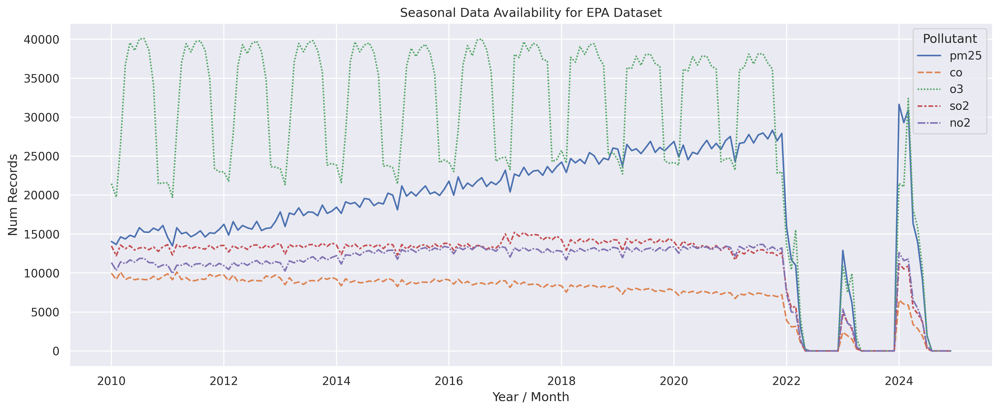

In [15]:
# The following visualization code is developed locally via jupyter notebooks
plt.rcParams.update({"figure.dpi": 300})
fig, ax = plt.subplots(figsize = (16,6))
plot = sns.lineplot(pd.melt(temporal_EPA, id_vars = "month"),
                    x = "month", y = "value", hue = "variable", style = "variable")

# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha = "right")
plt.xlabel("Year / Month")
plt.ylabel("Num Records")
plt.legend(title = "Pollutant")
plt.title("Seasonal Data Availability for EPA Dataset")
plt.show()

We can perform a similar temporal analysis on NOAA data. To conserve BigQuery quota, we will not be checking the availability of each variable. Instead, we will only compute the number of rows recorded by stations in the US for each month from 2010 to 2024.

Our analysis found that the availability of measurements from NOAA is mostly consistent throughout 2010 to 2024 apart from a short period of decreased measurement count between late 2018 and early 2019. Additionally, Feburary is consistently the month with the lowest measurement count. (Most likely due to the fact that Feburary only has 28 days while other months have 30 to 31 days.)

In [16]:
%%bigquery temporal_NOAA --project $project_id
/*
Temporal EDA analysis for NOAA data. (Montly Granuarity)
This query utilizes BigQuery's wildcard table function to merge multiple table
in the NOAA dataset.
Reference: https://docs.cloud.google.com/bigquery/docs/querying-wildcard-tables

Key Tools: Correlated Subqueries, DATE formatting

Estimated Quota: 1.41 GB
*/

-- First compute the montly record count for each station
WITH monthly_stn_count AS(
SELECT
  stn, wban, mo, year, COUNT(*) AS stn_month_count
FROM
  `bigquery-public-data.noaa_gsod.gsod20*`
WHERE
  _TABLE_SUFFIX BETWEEN '10' AND '24'
GROUP BY stn, wban, mo, year
),
-- Now filter by stations located in the US. Format the given year and month as date string.
us_monthly_count AS(
  SELECT DATE(CONCAT(year, "-", mo, "-01")) AS month, SUM(c.stn_month_count) AS n
  FROM monthly_stn_count c
  WHERE EXISTS(
    SELECT 1 FROM `cs145-474518.cs145_project_main.noaa_lookup` l
    WHERE l.stn = c.stn AND l.wban = c.wban
  )
  GROUP BY mo, year
)

SELECT *
FROM us_monthly_count
ORDER BY month ASC

Query is running:   0%|          |

Downloading:   0%|          |

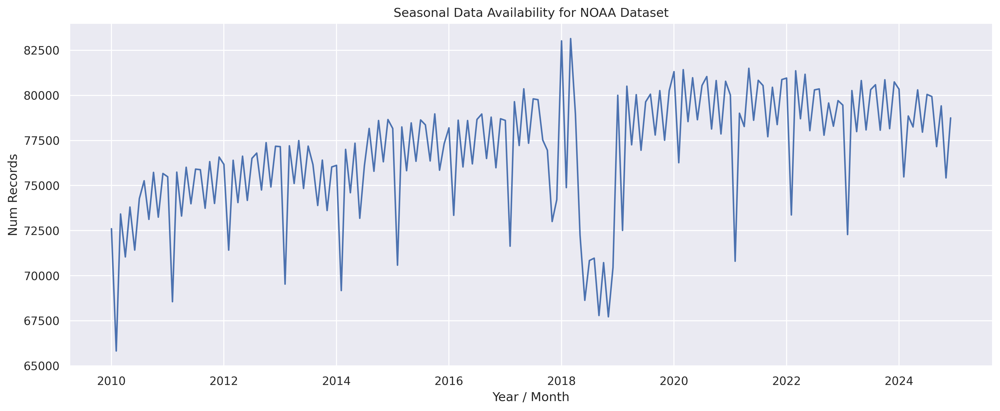

In [18]:
# Similar plotting code as above.
plt.rcParams.update({"figure.dpi": 300})
fig, ax = plt.subplots(figsize = (16,6))
plot = sns.lineplot(temporal_NOAA, x = "month", y = "n")

plt.xlabel("Year / Month")
plt.ylabel("Num Records")
plt.title("Seasonal Data Availability for NOAA Dataset")
plt.show()

### 3.1.2 Spatial Coverage Analysis

For our spatial coverage analysis, we will focus on **the number of days with available measurements** for each US county from 2015 to 2024. $^1$ We choose PM 2.5 as the pollutant of interest in this study since our temporal coverage analysis shows that PM 2.5 has good data availability without too much seasonal variations. Again, we will only use measurements that conforms to a NAAQS standard.

Note:
 1. Since our following analysis will focus primarily on the county-level, all measurements taken per county per day will be aggregated so raw measurement count is not as informative as the number of days with available data.

_Some visualizations in this document were made with plotly. These visualizations contain animated elements, and plotly's embedded graphics viewer may have compatibility issues with Gradescope. All animated visualizations made with plotly will be rendered as GIF images to be attached in this notebook, and python code for such visualizations will be provided for replication purposes._


In [ ]:
%%bigquery spatial_EPA_counties --project $project_id
/*
Focusing on the PM2.5 data, obtain the dataframe necessary to visualize the
spatial-temporal coverage of the EPA measurements. (Annual Temporal Granularity)

Key Tools: Multi-level GROUP BY aggregation, CTE, CROSS JOIN (cartesian prod.)

Estimated Quota: 206 MB
*/

-- First we will generate a table with all counties (fips) and all years of interest
WITH all_county_years AS(
  SELECT f.fips, d.date_local, CONCAT(f.county_name, ", ", f.state_name) as county_name
  FROM `cs145-474518.cs145_project_main.county_fips` f
  CROSS JOIN (
  SELECT *
  FROM UNNEST (GENERATE_DATE_ARRAY('2010-01-01', '2024-12-31', INTERVAL 1 YEAR)) as date_local
) d
),
-- Filter the PM25 table and group by by (county, day)
pm AS(
  SELECT CONCAT(state_code, county_code) AS fips, date_local
  FROM bigquery-public-data.epa_historical_air_quality.pm25_frm_daily_summary
  WHERE pollutant_standard = "PM25 24-hour 2012"
    AND EXTRACT(YEAR FROM date_local) >= 2010
    AND EXTRACT(YEAR FROM date_local) <  2025
  GROUP BY state_code, county_code, date_local
),
-- Count the number of days for each year with measurements
pm_count AS(
  SELECT fips, EXTRACT(YEAR FROM date_local) as year, COUNT(date_local) as days
  FROM pm
  GROUP BY fips, EXTRACT(YEAR FROM date_local)
)
-- Join the count and county / year table together
SELECT y.fips, y.county_name, EXTRACT(YEAR FROM y.date_local) as year, IFNULL(c.days, 0) as days
FROM all_county_years y
  LEFT JOIN pm_count c
  ON y.fips = c.fips AND c.year = EXTRACT(YEAR FROM y.date_local)
ORDER BY c.days DESC


In [ ]:
# Python code used to generate the visualization is attached below for reference
# Do not run this cell. Plotly's interactive plot may cause compatibility issues

"""
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

colorscale = ["#f7fbff", "#ebf3fb", "#deebf7", "#d2e3f3", "#c6dbef", "#b3d2e9", "#9ecae1",
    "#85bcdb", "#6baed6", "#57a0ce", "#4292c6", "#3082be", "#2171b5", "#1361a9",
    "#08519c", "#0b4083", "#08306b"
]


px.choropleth(
    spatial_EPA_counties,
    geojson = counties,
    locations = "fips",
    color = "days",
    range_color=(0, 365),
    animation_frame="year",
    color_continuous_scale=colorscale,
    scope = "usa",
    labels = {'days' : "Num Days w/ Data"}
)
"""

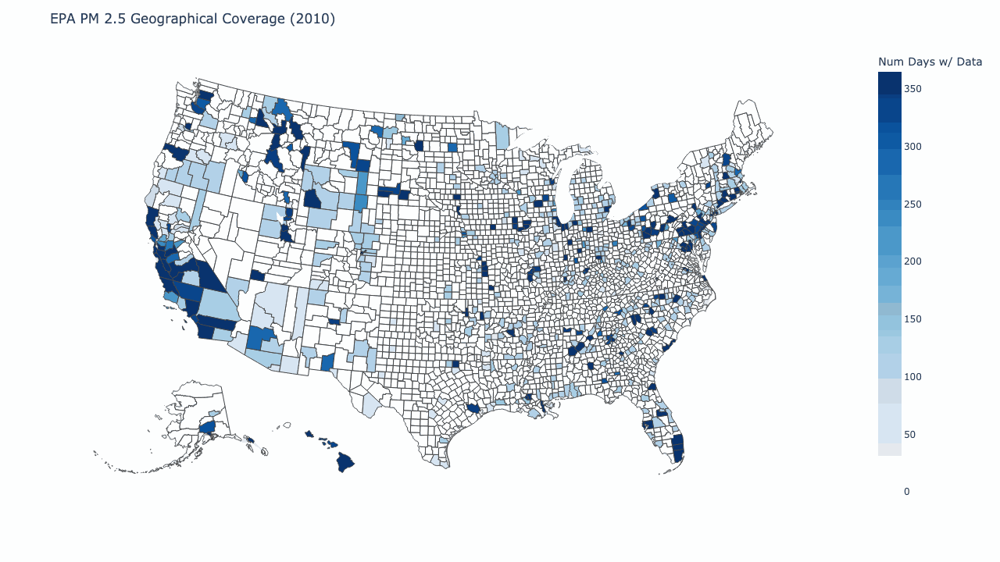

Disappointingly, EPA's historical air quality data does not cover the majority of US counties. However, certain states like California, Massachusettes, and Pennsylvania have decent data availability. We also see better data availability around major population centers.

We shall do the same for the NOAA data.

In [ ]:
%%bigquery spatial_NOAA_counties --project $project_id
/*
Obtain the dataframe necessary to visualize the spatial-temporal coverage of
the NOAA measurements. (Annual Temporal Granularity)

Key Tools: CTE, DATE Functions, LEFT JOIN, NULL handling

Estimated Quota: 1.64 GB
*/

-- First compute the montly record count for each station
WITH stn_days AS(
SELECT
  stn, wban, year, mo, da
FROM
  `bigquery-public-data.noaa_gsod.gsod20*` g
WHERE
  _TABLE_SUFFIX BETWEEN '10' AND '24'
GROUP BY stn, wban, year, mo, da
),
-- Now filter by stations located in the US. Join with lookup for fips
us_county_days AS(
  SELECT l.fips, DATE(CONCAT(year, "-", mo, "-", da)) as date_local
  FROM stn_days s
    JOIN `cs145-474518.cs145_project_main.noaa_lookup` l
    ON s.stn = l.stn AND s.wban = l.wban
  GROUP BY l.fips, s.year, s.mo, s.da
),
-- Aggregate the day count from years
us_day_counts AS(
  SELECT fips, EXTRACT(YEAR FROM date_local) as year, COUNT(*) as days
  FROM us_county_days
  GROUP BY fips, EXTRACT(YEAR FROM date_local)
),
all_county_years AS(
  SELECT f.fips, d.date_local, CONCAT(f.county_name, ", ", f.state_name) as county_name
  FROM `cs145-474518.cs145_project_main.county_fips` f
  CROSS JOIN (
  SELECT *
  FROM UNNEST (GENERATE_DATE_ARRAY('2010-01-01', '2024-12-31', INTERVAL 1 YEAR)) as date_local
) d
)
-- Join the count and county / year table together
SELECT y.fips, y.county_name, EXTRACT(YEAR FROM y.date_local) as year, IFNULL(c.days, 0) as days
FROM all_county_years y
  LEFT JOIN us_day_counts c
  ON y.fips = c.fips AND c.year = EXTRACT(YEAR FROM y.date_local)
ORDER BY c.days DESC

In [ ]:
# Python code used to generate the visualization is attached below for reference
# Do not run this cell. Plotly's interactive plot may cause compatibility issues

"""
colorscale = ["#f7fbff", "#ebf3fb", "#deebf7", "#d2e3f3", "#c6dbef", "#b3d2e9", "#9ecae1",
    "#85bcdb", "#6baed6", "#57a0ce", "#4292c6", "#3082be", "#2171b5", "#1361a9",
    "#08519c", "#0b4083", "#08306b"
]

px.choropleth(
    spatial_NOAA_counties,
    geojson = counties,
    locations = "fips",
    color = "days",
    range_color=(0, 365),
    animation_frame="year",
    color_continuous_scale=colorscale,
    scope = "usa",
    labels = {'days' : "Num Days w/ Data"}
)
"""

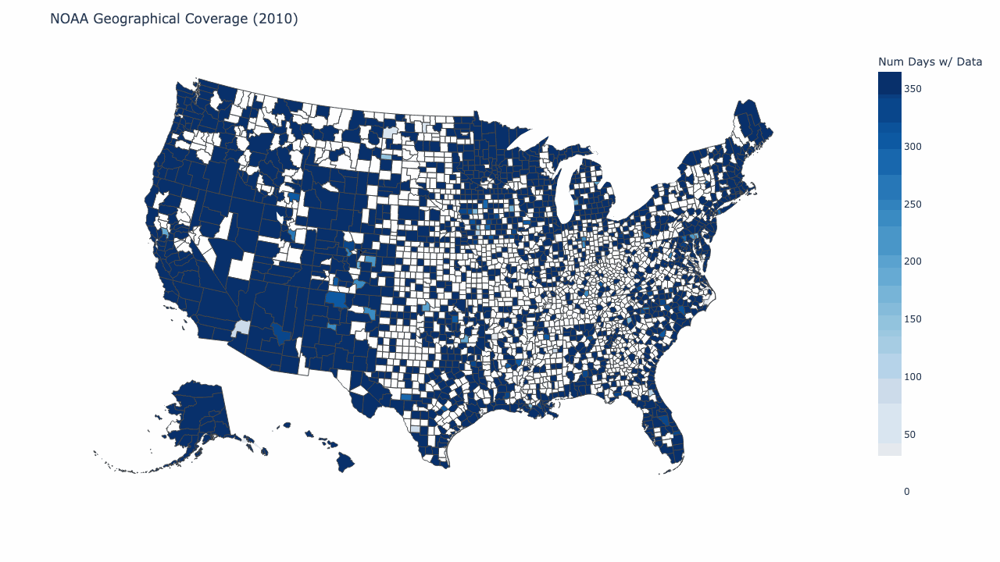

Note that the NOAA dataset has much better spatial and temporal coverage than the EPA data. This means that the number of records we can `JOIN` between the two datasets will be ultimately bottlenecked by EPA's data availability.


### 3.1.3 Counties with Sufficient EPA measurements

Before moving to more analysis sections, let's perform a final query to obtain the "key EPA counties." That is, counties that have, on average, at least 100 days per year with at least 3 key EPA measurements. (CO, NO2, SO2, O3 and PM2.5) We will use the 10 years from 2011 to 2020 (inclusive) in our average calculations. This gives up 382 counties to work with.

In [19]:
%%bigquery --project $project_id
/*
Obtain all counties with >= 100 daily measurements per year in at least 3 of
PM2.5, CO, O3, NO2 and SO2.

Key Tools: Multiple Left Join, NULLs, Subqueries, Boolean Arithmetic via type casting

Estimated Quota: 1.41 GB
*/

-- For each county, compute the days with available measurements for each year
WITH pm AS(
  SELECT CONCAT(state_code, county_code) as fips,
    EXTRACT(YEAR FROM date_local) as year,
    COUNT(DISTINCT date_local) as days
  FROM bigquery-public-data.epa_historical_air_quality.pm25_frm_daily_summary
  WHERE pollutant_standard = "PM25 24-hour 2012"
    AND EXTRACT(YEAR FROM date_local) >= 2011
    AND EXTRACT(YEAR FROM date_local) <  2021
  GROUP BY EXTRACT(YEAR FROM date_local), state_code, county_code
),
co AS(
  SELECT CONCAT(state_code, county_code) as fips,
    EXTRACT(YEAR FROM date_local) as year,
    COUNT(DISTINCT date_local) as days
  FROM bigquery-public-data.epa_historical_air_quality.co_daily_summary
  WHERE pollutant_standard = "CO 8-hour 1971"
    AND EXTRACT(YEAR FROM date_local) >= 2011
    AND EXTRACT(YEAR FROM date_local) <  2021
 GROUP BY EXTRACT(YEAR FROM date_local), state_code, county_code
),
o3 AS(
  SELECT CONCAT(state_code, county_code) as fips,
    EXTRACT(YEAR FROM date_local) as year,
    COUNT(DISTINCT date_local) as days
  FROM bigquery-public-data.epa_historical_air_quality.o3_daily_summary
  WHERE pollutant_standard = "Ozone 8-hour 2015"
    AND EXTRACT(YEAR FROM date_local) >= 2011
    AND EXTRACT(YEAR FROM date_local) <  2021
  GROUP BY EXTRACT(YEAR FROM date_local), state_code, county_code
),
no2 AS(
  SELECT CONCAT(state_code, county_code) as fips,
    EXTRACT(YEAR FROM date_local) as year,
    COUNT(DISTINCT date_local) as days
  FROM bigquery-public-data.epa_historical_air_quality.no2_daily_summary
  WHERE pollutant_standard = "NO2 1-hour 2010"
    AND EXTRACT(YEAR FROM date_local) >= 2011
    AND EXTRACT(YEAR FROM date_local) <  2021
  GROUP BY EXTRACT(YEAR FROM date_local), state_code, county_code
),
so2 AS(
  SELECT CONCAT(state_code, county_code) as fips,
    EXTRACT(YEAR FROM date_local) as year,
    COUNT(DISTINCT date_local) as days
  FROM bigquery-public-data.epa_historical_air_quality.so2_daily_summary
  WHERE pollutant_standard = "SO2 1-hour 2010"
    AND EXTRACT(YEAR FROM date_local) >= 2011
    AND EXTRACT(YEAR FROM date_local) <  2021
  GROUP BY EXTRACT(YEAR FROM date_local), state_code, county_code
),
-- Now perform the averaging and joining tables together. Start with all counties so Left Join.
all_county_avgs AS(
  SELECT cty.fips, cty.state_name, cty.county_name,
     IFNULL(p.avg_pm,0) as avg_pm,
     IFNULL(o.avg_o3,0) as avg_o3,
     IFNULL(c.avg_co,0) as avg_co,
     IFNULL(n.avg_no2,0) as avg_no2,
     IFNULL(s.avg_so2,0) as avg_so2
  FROM `cs145-474518.cs145_project_main.county_fips` cty
    LEFT JOIN (
      SELECT fips, AVG(days) as avg_pm FROM pm GROUP BY fips
    )p
    ON p.fips = cty.fips
    LEFT JOIN (
      SELECT fips, AVG(days) as avg_o3 FROM o3 GROUP BY fips
    )o
    ON o.fips = cty.fips
    LEFT JOIN (
      SELECT fips, AVG(days) as avg_co FROM co GROUP BY fips
    )c
    ON c.fips = cty.fips
    LEFT JOIN (
      SELECT fips, AVG(days) as avg_so2 FROM so2 GROUP BY fips
    )s
    ON s.fips = cty.fips
    LEFT JOIN (
      SELECT fips, AVG(days) as avg_no2 FROM no2 GROUP BY fips
    )n
    ON n.fips = cty.fips
)
-- Use some boolean algebra to filter the counties with at least 3 conditions met
SELECT *
FROM all_county_avgs
WHERE SAFE_CAST(avg_pm >= 100.0 AS INT64) +
      SAFE_CAST(avg_co >= 100.0 AS INT64) +
      SAFE_CAST(avg_o3 >= 100.0 AS INT64) +
      SAFE_CAST(avg_no2 >= 100.0 AS INT64) +
      SAFE_CAST(avg_so2 >= 100.0 AS INT64) >= 5 -- May relax this a bit
  AND state_name = "California"

/*
Remark: The query with the at least 3 relaxation is saved in our BigQuery
Project for later use. There are only 126 US counties with all 5 pollutant
measurements being sufficient.

When ran in the notebook, this query will only display counties in CA that
has at least 100 daily measurements per year on all 5 pollutants, which are:
Alameda, Contra Costa, Fresno, Humboldt, Imperial, Los Angeles, Orange,
Riverside, Sacramento, San Bernardino, San Diego, Santa Barbara, Santa Clara,
Solano
*/

Query is running:   0%|          |

Downloading:   0%|          |

,fips,state_name,county_name,avg_pm,avg_o3,avg_co,avg_no2,avg_so2
0,06001,California,Alameda,365.3,365.3,365.3,365.3,363.400000
1,06013,California,Contra Costa,337.5,365.3,365.3,365.3,365.300000
2,06019,California,Fresno,365.3,365.3,365.3,365.3,353.700000
3,06023,California,Humboldt,198.8,364.2,363.9,358.4,364.200000
4,06025,California,Imperial,282.7,365.3,361.1,365.1,353.000000
5,06037,California,Los Angeles,343.9,365.3,365.3,365.3,365.300000
6,06059,California,Orange,329.7,365.3,365.3,365.3,303.428571
7,06065,California,Riverside,364.9,365.3,365.3,365.3,359.700000
8,06067,California,Sacramento,318.3,365.3,365.3,365.3,345.000000
9,06071,California,San Bernardino,259.3,365.3,365.3,365.3,365.300000


## Section 3.2 Visualizing Seasonal Trends of Hazardous Pollutant Levels

Inspired by a similar analysis task in project 1, we will continue to investigate the seasonal trends of dangerous pollutant levels. We will use the number of days per month which at least one key pollutant reaches hazardous levels as the key metric. Our hazard thresholds are provided by the National Ambient Air Quality Standards / [NAAQS](https://www.epa.gov/criteria-air-pollutants/naaqs-table):

- PM2.5: 24-hour Average >= 35.5 $\mu$g/m$^3$
- CO: 8-hour Average >= 9.5 PPM
- SO2: 1-hour Maximum > 75 PPB (0.075 PPM)
- NO2: 1-hour Maximum > 100 PPB (0.1 PPM)
- O3: 8-hour Maximum > 0.07 PPM

We will focus on the 382 counties with sufficient EPA measurements found above. If a county has multiple measurements per day, we will use average aggregation on arithmetic mean for PM2.5 and CO, and we will use max aggregation on daily max for SO2, NO2 and O3.

We will also experiment with time series interpolation methods with this query. In project 1, we did not include days without measurements in our analysis. This may lead to inaccurate results if we wish to count the number of days with hazardous levels. One potential solution is to use BigQuery's `GAP_FILL` method to linearly interpolate the dates with missing measurements and therefore "predict" the pollutant levels on those days. We expect that this will lead to a more accurate day count. We will report our top results both with and without time series interpolation.


In [20]:
%%bigquery haz_county --project $project_id
/*
Compute the number of days where at least one pollutant is hazardous for each
of the 382 Key EPA Counties. Day count is average over 2015 - 2019.

Key Tools: CTE, Multiple JOINs, Time Series Functions, IF Casing

Estimated Quota: 1.75 GB
*/

-- First obtain a list of all key counties with all relevant dates
WITH relevant_cty_days AS(
  SELECT f.fips, d.date_local
  FROM `cs145-474518.cs145_project_main.epa_key_county` f
  CROSS JOIN (
  SELECT *
  FROM UNNEST (GENERATE_DATE_ARRAY('2015-01-01', '2019-12-31', INTERVAL 1 DAY)) as date_local
) d
),
-- Now do EPA data cleaning
-- mean aggregation for PM2.5 and CO
pm AS(
  SELECT CONCAT(state_code, county_code) as fips,
    date_local,
    AVG(arithmetic_mean) as pm_agg
  FROM bigquery-public-data.epa_historical_air_quality.pm25_frm_daily_summary
  WHERE pollutant_standard = "PM25 24-hour 2012"
    AND EXTRACT(YEAR FROM date_local) >= 2015
    AND EXTRACT(YEAR FROM date_local) <  2020
  GROUP BY date_local, state_code, county_code
),
co AS(
  SELECT CONCAT(state_code, county_code) as fips,
    date_local,
    AVG(arithmetic_mean) as co_agg
  FROM bigquery-public-data.epa_historical_air_quality.co_daily_summary
  WHERE pollutant_standard = "CO 8-hour 1971"
    AND EXTRACT(YEAR FROM date_local) >= 2015
    AND EXTRACT(YEAR FROM date_local) <  2020
 GROUP BY date_local, state_code, county_code
),
-- max aggregation for O3, NO2 and SO2
o3 AS(
  SELECT CONCAT(state_code, county_code) as fips,
    date_local,
    MAX(first_max_value) as o3_agg
  FROM bigquery-public-data.epa_historical_air_quality.o3_daily_summary
  WHERE pollutant_standard = "Ozone 8-hour 2015"
    AND EXTRACT(YEAR FROM date_local) >= 2015
    AND EXTRACT(YEAR FROM date_local) <  2020
  GROUP BY date_local, state_code, county_code
),
no2 AS(
  SELECT CONCAT(state_code, county_code) as fips,
    date_local,
    MAX(first_max_value) as no2_agg
  FROM bigquery-public-data.epa_historical_air_quality.no2_daily_summary
  WHERE pollutant_standard = "NO2 1-hour 2010"
    AND EXTRACT(YEAR FROM date_local) >= 2015
    AND EXTRACT(YEAR FROM date_local) <  2020
  GROUP BY date_local, state_code, county_code
),
so2 AS(
  SELECT CONCAT(state_code, county_code) as fips,
    date_local,
    MAX(first_max_value) as so2_agg
  FROM bigquery-public-data.epa_historical_air_quality.so2_daily_summary
  WHERE pollutant_standard = "SO2 1-hour 2010"
    AND EXTRACT(YEAR FROM date_local) >= 2015
    AND EXTRACT(YEAR FROM date_local) <  2020
  GROUP BY date_local, state_code, county_code
),
-- Join all records together. NULL here indicate missing values. (Needs for Time Series Interpolation)
all_records AS(
  SELECT cty.fips, cty.date_local, p.pm_agg, c.co_agg, o.o3_agg, n.no2_agg, s.so2_agg
  FROM relevant_cty_days cty
    LEFT JOIN pm  p ON p.fips = cty.fips AND p.date_local = cty.date_local
    LEFT JOIN co  c ON c.fips = cty.fips AND c.date_local = cty.date_local
    LEFT JOIN o3  o ON o.fips = cty.fips AND o.date_local = cty.date_local
    LEFT JOIN no2 n ON n.fips = cty.fips AND n.date_local = cty.date_local
    LEFT JOIN so2 s ON s.fips = cty.fips AND s.date_local = cty.date_local
),
-- Time Series linear interpolation for missing data
-- https://docs.cloud.google.com/bigquery/docs/reference/standard-sql/time-series-functions#gap_fill
interpolated_records AS(
  SELECT fips, date_local, pm_agg, co_agg, o3_agg, no2_agg, so2_agg
  FROM GAP_FILL(
    TABLE all_records,
    ts_column => 'date_local',
    bucket_width => INTERVAL 1 DAY,
    partitioning_columns => ['fips'],
    value_columns => [
      ("pm_agg", "linear"),
      ("co_agg", "linear"),
      ("o3_agg", "linear"),
      ("no2_agg","linear"),
      ("so2_agg","linear") -- Use linear interpolation
    ]
  )
),
-- Fill remaining non-interpolated NULLs (at beginning or end) with 0's
final_records AS(
  SELECT fips, date_local,
  IFNULL(pm_agg, 0.0) AS pm, IFNULL(co_agg, 0.0) AS co, IFNULL(o3_agg, 0.0) AS o3,
  IFNULl(no2_agg, 0.0) AS no2, IFNULL(so2_agg, 0.0) AS so2
  FROM all_records -- Change this to interpolated for interpolated results
),
-- Flag the days with hazardous levels
cty_hazardous_days AS(
  SELECT fips, date_local,
  IF(pm >= 35.5 OR co >= 9.5 OR so2 > 75.0 OR no2 > 100.0 OR o3 > 0.070, 1, 0) as hazard_flag
  FROM final_records
),
-- Group By Month, Then Average Across Years
cty_monthly_h_count AS(
  SELECT fips, EXTRACT(YEAR FROM date_local) as year, EXTRACT(MONTH FROM date_local) as month,
    SUM(hazard_flag) as h_days
  FROM cty_hazardous_days
  GROUP BY fips, EXTRACT(YEAR FROM date_local), EXTRACT(MONTH FROM date_local)
),
cty_monthly_avg_count AS(
  SELECT fips, month, ROUND(AVG(h_days), 3) AS haz_days
  FROM cty_monthly_h_count
  GROUP BY fips, month
)
-- Display the Result with State Names
SELECT l.fips, r.state_name, r.county_name, l.month, l.haz_days
FROM cty_monthly_avg_count l
  JOIN `cs145-474518.cs145_project_main.county_fips` r
    ON l.fips = r.fips
ORDER BY l.haz_days DESC
LIMIT 10

Query is running:   0%|          |

Downloading:   0%|          |

The attached query is expected to return the results below. Notice all of the top results correspond to counties in central / southern CA in the summer months.

| County | Month | Hazard Days |
| --- | --- | --- |
| San Bernardino, CA | August | 29.2 |
| San Bernardino, CA | July | 28.2 |
| San Bernardino, CA | June | 25.2 |
| Riverside, CA | June | 23.6 |
| Riverside, CA | August | 23.4 |
| Los Angeles, CA | August | 23.2 |
| Tulare, CA | August | 23.0 |
| Riverside, CA | July | 21.8 |
| Kern, CA | August | 21.6 |
| Tulare, CA | July | 21.2 |

Interpolation did not change our top results by much. The only record with an observed change is `(Tulare, August)`. Its number of hazardous days changed from 23.0 to 23.2, indicating the measurement record for one *potentially hazardous* day within the 5-year span was not available.

We used the full dataset with all 382 counties to create the following visualization:


In [ ]:
# Python code used to generate the visualization is attached below for reference
# Do not run this cell. Plotly's interactive plot may cause compatibility issues
"""
color_scale = [
    '#c3e6cb',  # light green
    '#ffc107',  # yellow
    '#ff9800',  # orange
    '#e53935',  # red
    '#8b0000'   # very dark red
]

px.choropleth(
    haz_county,
    geojson = counties,
    locations = "fips",
    color = "haz_days",
    range_color=(0, 30),
    animation_frame="month",
    color_continuous_scale=color_scale,
    scope = "usa",
    labels = {'haz_days' : "Num Hazardous Days"}
)
"""

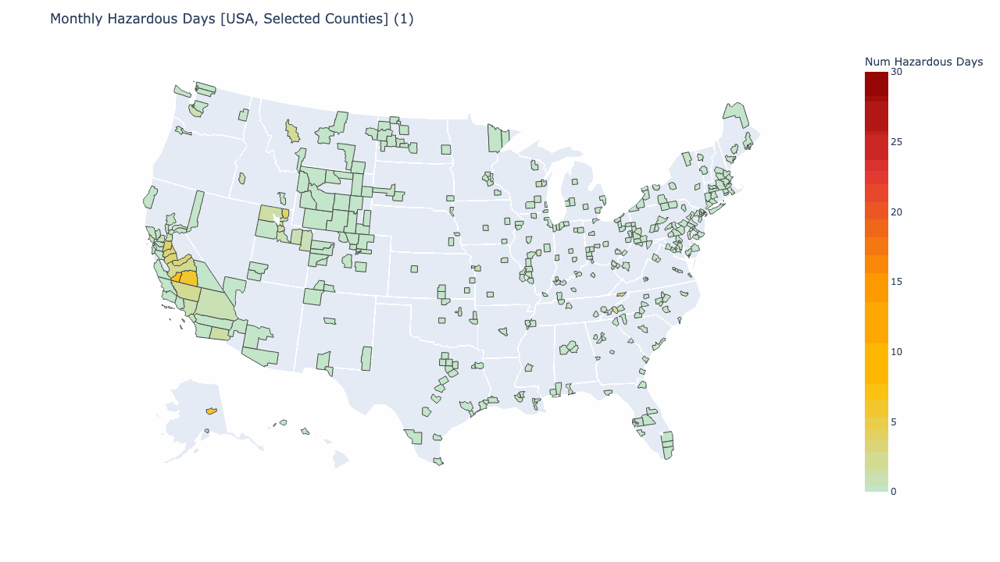

A bonus visualization for the state of California is also provided below. Note that it seems that pollution is propagating from the south to the north during the Autumn months. Costal counties appear to have fewer pollution hazards than inland ones.

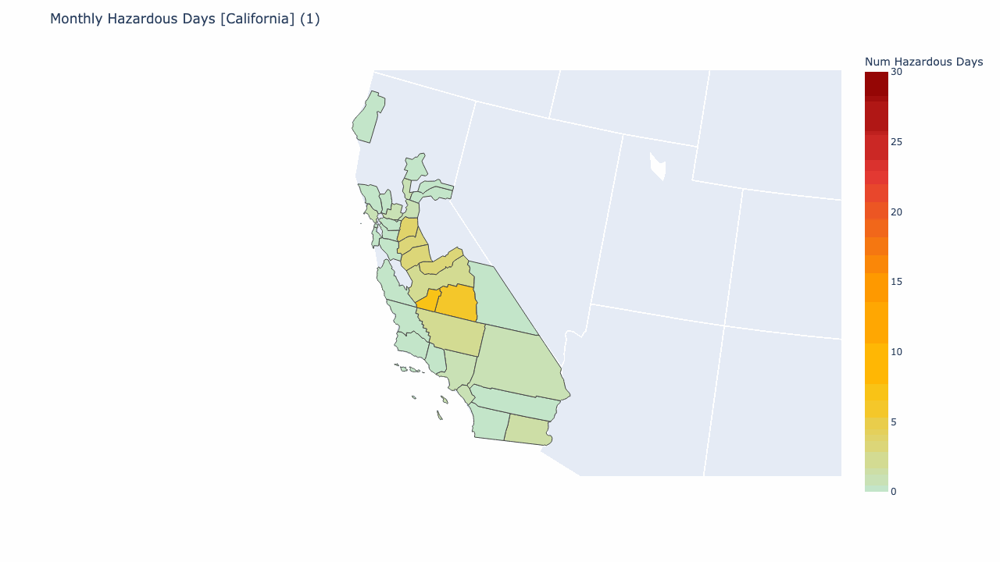

## Section 3.3 Preliminary Relationship Studies

A key objective of this project is to understand the relationships between air quality, weather, health outcome, and air traffic. As a preliminary sanity check, we shall utilize scatter plots to visualize the relationship between Air Pollution and other key variables of interest.

_Developing the right SQL query for relationship studies usually involve iterative refinements in data cleaning. We will still include intermediate results that motivated important changes we implemented for the final query, but we will not include our intermediate queries since the differences from our final query are minor._

### 3.3.1 Relationship between Health Outcomes and Air Pollution




We summarize the county-level pollution metric by using the annual average PM2.5 measurement in 2019. This gives us 624 coounties to work with.

In [21]:
%%bigquery rel_sdi --project $project_id
/*
Relationship studies with PM 2.5 and SDI.

Key Tools: Correlated Subqueries

Estimated Quota: 260 MB
*/

-- Use Annual Mean for PM 2.5
WITH pm_all AS(
  SELECT CONCAT(state_code, county_code) AS fips, AVG(arithmetic_mean) AS mean
  FROM bigquery-public-data.epa_historical_air_quality.pm25_frm_daily_summary
  WHERE pollutant_standard = "PM25 24-hour 2012"
    AND EXTRACT(YEAR FROM date_local) = 2019
  GROUP BY state_code, county_code, EXTRACT(YEAR FROM date_local)
)
-- This should be formulated as a JOIN but I feel like I haven't written enough subqueries
SELECT l.fips, l.mean, (
    SELECT r.sdi
    FROM `cs145-474518.cs145_project_main.sdi` r
      WHERE l.fips = r.fips
  ) as sdi, (
    SELECT r.sdi_score
    FROM `cs145-474518.cs145_project_main.sdi` r
      WHERE l.fips = r.fips
  ) as sdi_score
  FROM pm_all l
  ORDER BY l.fips ASC


Query is running:   0%|          |

Downloading:   0%|          |

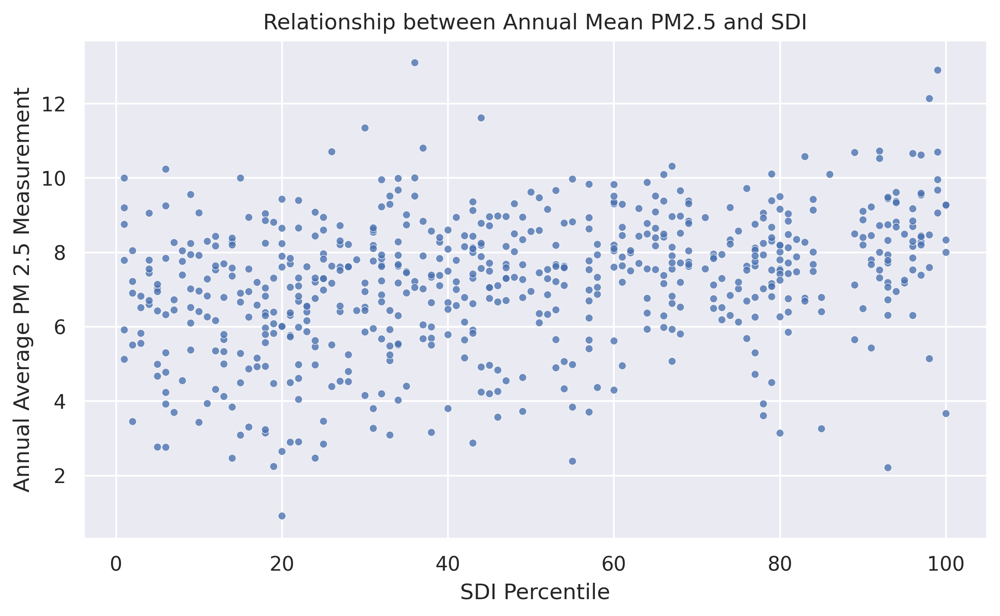

In [22]:
fig, ax = plt.subplots(figsize = (9,5))
sns.scatterplot(rel_sdi, x = "sdi_score", y = "mean", alpha = 0.8, size = 1)
ax.legend().set_visible(False)
plt.xlabel("SDI Percentile")
plt.ylabel("Annual Average PM 2.5 Measurement")
plt.title("Relationship between Annual Mean PM2.5 and SDI")
plt.show()
# Correlation = 0.317

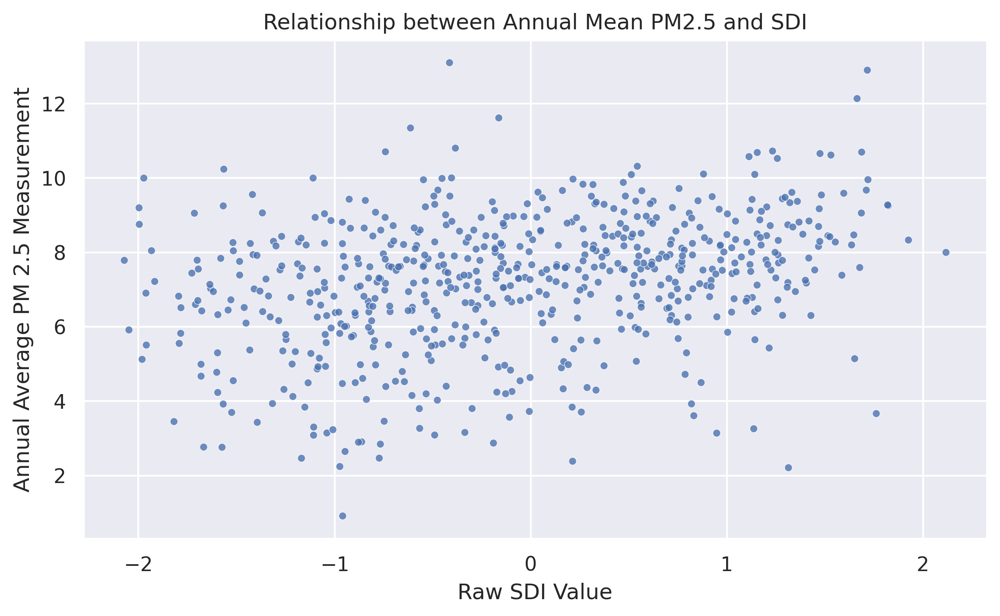

In [23]:
fig, ax = plt.subplots(figsize = (9,5))
sns.scatterplot(rel_sdi, x = "sdi", y = "mean", alpha = 0.8, size = 1)
ax.legend().set_visible(False)
plt.xlabel("Raw SDI Value")
plt.ylabel("Annual Average PM 2.5 Measurement")
plt.title("Relationship between Annual Mean PM2.5 and SDI")
plt.show()
# Correlation = 0.314

We clearly see a positive correlation between annual average PM2.5 and SDI, both with the percentile score and raw values. The relationship between PM2.5 and SDI percentile looks a bit weaker but is mostly linear, while the relationship with the raw SDI value is stronger but potentially **non-linear**: From visual inspection, as SDI value is increased, pollution level first decreases slightly but then increase.

To conclude, there **is** a positive correlation between air pollution and healthcare challenges. However, keep in mind that the relationship between air pollution and health challenges is **confounded by many variables that are subject to more extensive studies of social science**.

### 3.3.2 Relationship Between Air Traffic and Air Pollution

Since our T-100 traffic dataset is more granular than SDI, we should be able to associate the T-100 records and SDI records on a monthly basis. We will use the monthly average PM2.5 measurements and monthly total airport traffic (departure + arrival) for all airports in each county as key metrics. The following scatter plot is generated using the raw monthly avg PM2.5 level and the raw traffic counts from 2015 to 2019.

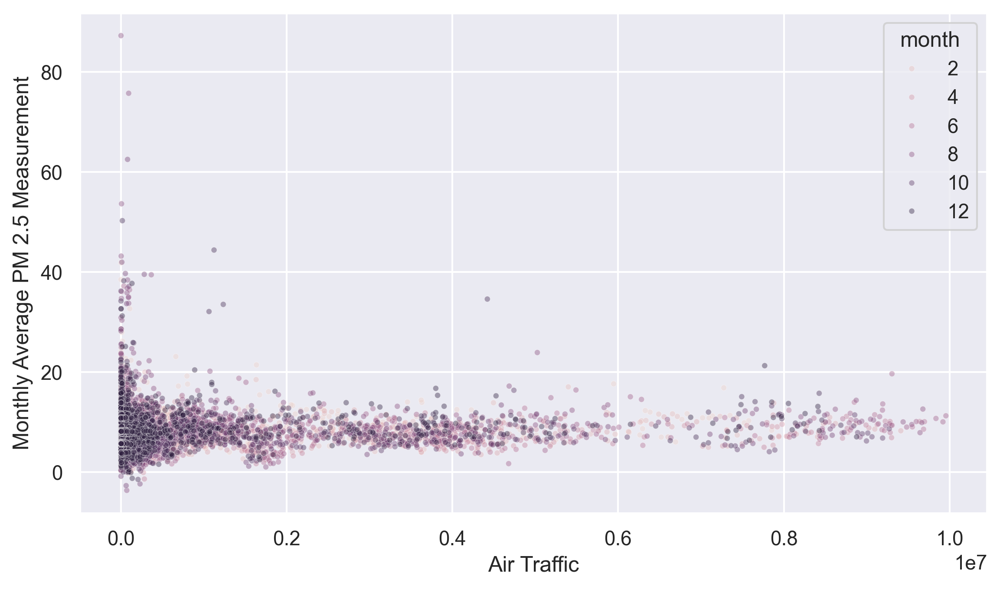

We realized that the distribution of air traffic has a significant skew to the right, which makes it harder to decipher the relationship. Moreover, our dataset includes many smaller airports without consistent passenger traffic, meaning that the variation of air traffic of those airports are not representitive of the overall traffic trends.

Therefore, we decided to clean-up the dataset by only considering records with >= 10,000 combined monthly passenger traffic and airports with >= 10 records that satisfy this passenger traffic constraint. A common procedure used in statistics to handle data skewness is log transformation:

In [24]:
%%bigquery rel_air --project $project_id
/*
Relationship study between PM2.5 Levels and County-Level Air Traffic.

Only considering airports with consistently good monthly traffic. Apply log
transformation for the passenger traffic.

Key Tools: CTE, Window Functions (for record count)

Estimated Quota: 560 MB
*/

-- Need to perform data cleaning for T-100
WITH dep AS(
  SELECT origin AS apt, year, month, SUM(passengers) AS dep_traffic
  FROM `cs145-474518.cs145_project_main.t100`
  WHERE year >= 2015 AND year < 2020
  GROUP BY origin, year, month
),
arr AS(
  SELECT dest AS apt, year, month, SUM(passengers) AS arr_traffic
  FROM `cs145-474518.cs145_project_main.t100`
  WHERE year >= 2015 AND year < 2020
  GROUP BY dest, year, month
),
-- Join the two tables for the full passenger traffic
total_traffic AS(
  SELECT d.apt, d.year, d.month,
    IFNULL(a.arr_traffic, 0) + IFNULL(d.dep_traffic, 0) AS traffic,
    -- Add a count of available records for each airport.
  FROM dep d
    FULL OUTER JOIN arr a
    ON d.apt = a.apt AND d.year = a.year AND d.month = a.month
),
-- Perform some pre-filtering for airport traffic
filtered_traffic AS(
  SELECT apt, year, month, traffic,
    COUNT(traffic) OVER (PARTITION BY apt) as record_count
    -- Add a record count to filter out airports without enough
    -- records later on
  FROM total_traffic
  WHERE traffic >= 10000 -- Only consider airports with enough passenger traffic
),
-- Aggregate traffic on county level.
county_traffic AS(
  SELECT r.state_name, r.county_name, l.year, l.month, SUM(l.traffic) as traffic
  FROM filtered_traffic l
    JOIN cs145-474518.cs145_project_main.airport_lookup r
    ON l.apt = r.code
  WHERE l.record_count >= 10 -- Only consider airports with enough data points
  GROUP BY r.state_name, r.county_name, l.year, l.month
),
-- Perform the usual data cleaning for PM 2.5 table
pollute_month AS(
  SELECT state_name, county_name,
  EXTRACT(YEAR FROM date_local) as year,
  EXTRACT(MONTH FROM date_local) as month, AVG(arithmetic_mean) AS mean
  FROM bigquery-public-data.epa_historical_air_quality.pm25_frm_daily_summary
  WHERE pollutant_standard = "PM25 24-hour 2012"
    AND EXTRACT(YEAR FROM date_local) >= 2015
    AND EXTRACT(YEAR FROM date_local) <  2020
  GROUP BY state_name, county_name, EXTRACT(YEAR FROM date_local), EXTRACT(MONTH FROM date_local)
)

SELECT l.state_name, l.county_name, l.year, l.month, LOG10(r.traffic) as log_traffic, l.mean
FROM pollute_month l
  JOIN county_traffic r
    ON l.state_name = r.state_name
  AND l.county_name = r.county_name
  AND l.year = r.year
  AND l.month = r.month
ORDER BY l.mean DESC


Query is running:   0%|          |

Downloading:   0%|          |

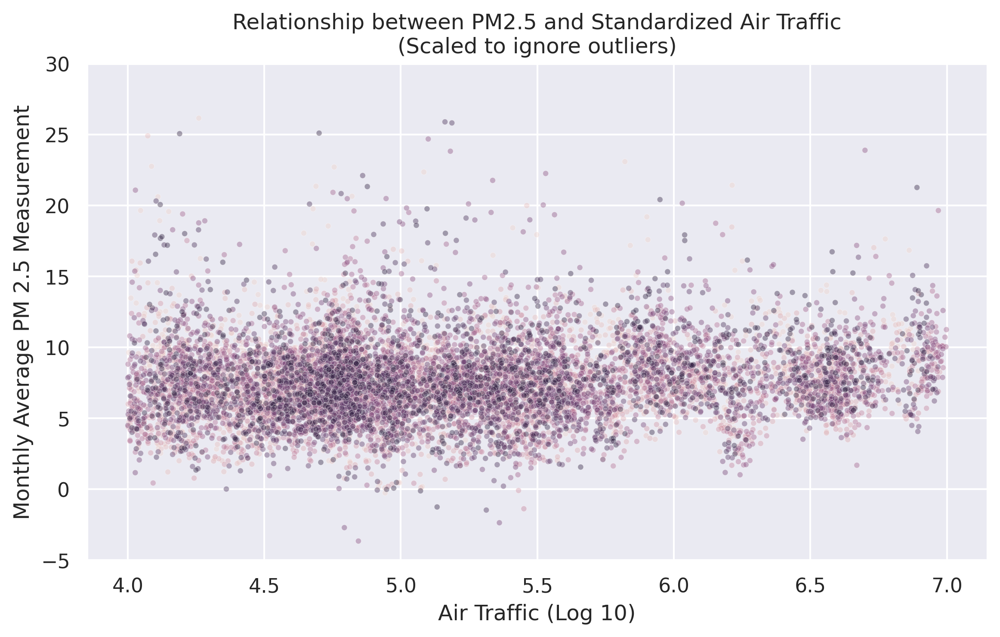

In [25]:
rel_air = rel_air.sort_values(by = "month")
fig, ax = plt.subplots(figsize = (9,5))
sns.scatterplot(rel_air, x = "log_traffic", y = "mean", hue = "month", alpha = 0.4, legend = False, s = 10)
ax.set_ylim(-5, 30)
plt.xlabel("Air Traffic (Log 10)")
plt.ylabel("Monthly Average PM 2.5 Measurement")
plt.title("Relationship between PM2.5 and Standardized Air Traffic\n(Scaled to ignore outliers)")
plt.show()
# Correlation = 0.08

We see a very slight positive correlation between $\log(\texttt{traffic})$ and PM 2.5 pollution level. But keep in mind that high pollution levels and high air traffic are both associated with large population centers.

(We also see some negative PM 2.5 measurements, which might be equipment fault or poor calibration.)

### 3.3.3 Relationship Between Weather and Air Pollution

We can also combine the EPA dataset with the NOAA dataset to study the relationship between weather elements and air pollution. In project 1, we have partially studied the effect of temperature on pollutant levels, so in this section, we will explore the relationship between atomspheric pressure, wind speed and pollutant level. Again, we shall use the 2019 PM2.5 data for our preliminary study.


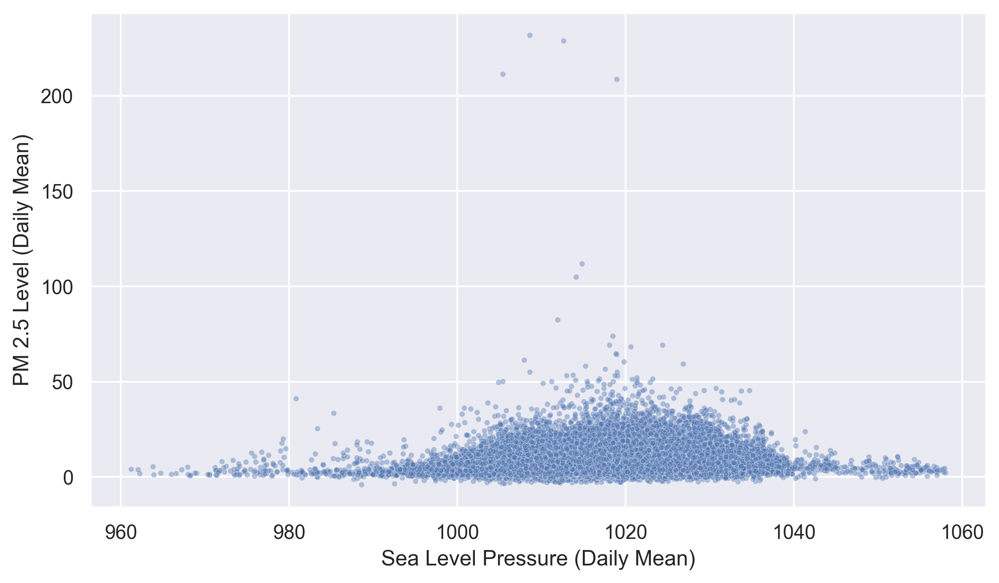

Both the EPA measurements and the NOAA measurements are susceptible to equipment noise, especially for counties with only one data point per day. We believe such measurement noise produced the outliers shown above with rather unusual levels of PM2.5 reading. One technique that we could employ for time series data denoising is to use a moving average. Due to the presence of extreme outliers, we believe a sliding window with a width of 7 days should be able to minimize the influence of such outliers while preserving the key relationships. Additionally, we shall restrict our attention to counties with sufficient EPA measurements only.

In [26]:
%%bigquery rel_noaa_avg --project $project_id
/*
Relationship study between air pressure / wind speed and PM 2.5 levels for
key counties only.

Moving average is used as a denoising technique to reduce the influence of
noisy measurements / outliers.

Key Tools: CTE, Window Functions (for rolling averages), Correlated Subqueries

Estimated Quota: 428 MB
*/
-- Perform data cleaning on NOAA data
WITH noaa AS(
  SELECT r.fips, l.stn, l.wban,
    DATE(CONCAT(year, "-", mo, "-", da)) as date_local,
    SAFE_CAST(l.wdsp AS FLOAT64) as wdsp, l.slp
  FROM `bigquery-public-data.noaa_gsod.gsod2019` l
    JOIN `cs145-474518.cs145_project_main.noaa_lookup` r
    ON l.stn = r.stn AND l.wban = r.wban
  WHERE SAFE_CAST(l.wdsp AS FLOAT64) < 999.0
    AND l.slp < 9999.0 -- Remove missing data
),
noaa_cty AS(
  SELECT fips, date_local, AVG(wdsp) as wdsp, AVG(slp) as slp
  FROM noaa
  GROUP BY fips, date_local
),
-- Perform data cleaning on EPA data. Use average aggregation
pm25_cty AS(
  SELECT CONCAT(state_code, county_code) AS fips, date_local,
    AVG(arithmetic_mean) as level
  FROM `bigquery-public-data.epa_historical_air_quality.pm25_frm_daily_summary`
  WHERE
      pollutant_standard = "PM25 24-hour 2012"
      AND EXTRACT(YEAR FROM date_local) = 2019
  GROUP BY date_local, state_code, county_code
)
-- JOIN EPA and NOAA data, Compute sliding average
-- Only use key counties with sufficient measurements
SELECT r.fips, r.date_local,
  AVG(r.level) OVER (PARTITION BY l.fips ORDER BY r.date_local ROWS BETWEEN 3 PRECEDING AND 3 FOLLOWING) as avg_pm25,
  AVG(l.slp)   OVER (PARTITION BY l.fips ORDER BY r.date_local ROWS BETWEEN 3 PRECEDING AND 3 FOLLOWING) as avg_slp,
  AVG(l.wdsp)  OVER (PARTITION BY l.fips ORDER BY r.date_local ROWS BETWEEN 3 PRECEDING AND 3 FOLLOWING) as avg_wdsp,
FROM noaa_cty l
  JOIN pm25_cty r
  ON l.fips = r.fips AND l.date_local = r.date_local
WHERE EXISTS(
  SELECT 1
  FROM `cs145-474518.cs145_project_main.epa_key_county` k
    WHERE r.fips = k.fips
)

Query is running:   0%|          |

Downloading:   0%|          |

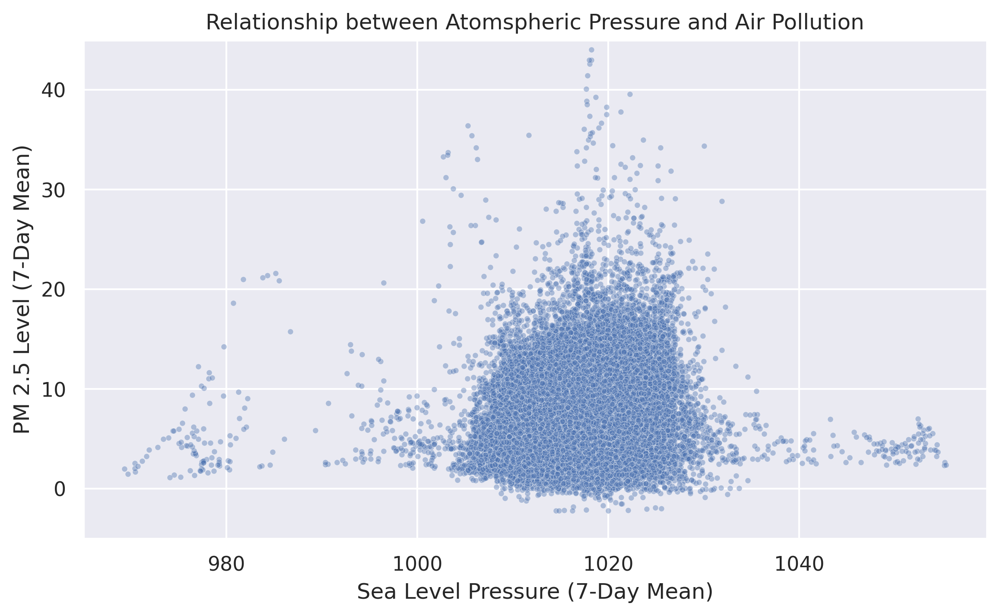

In [30]:
fig, ax = plt.subplots(figsize = (9,5))
sns.scatterplot(rel_noaa_avg, x = "avg_slp", y = "avg_pm25", alpha = 0.4, s = 10)
plt.xlabel("Sea Level Pressure (7-Day Mean)")
plt.ylabel("PM 2.5 Level (7-Day Mean)")
plt.title("Relationship between Atomspheric Pressure and Air Pollution")
plt.ylim(-5, 45)
plt.show()
# Correlation = 0.14

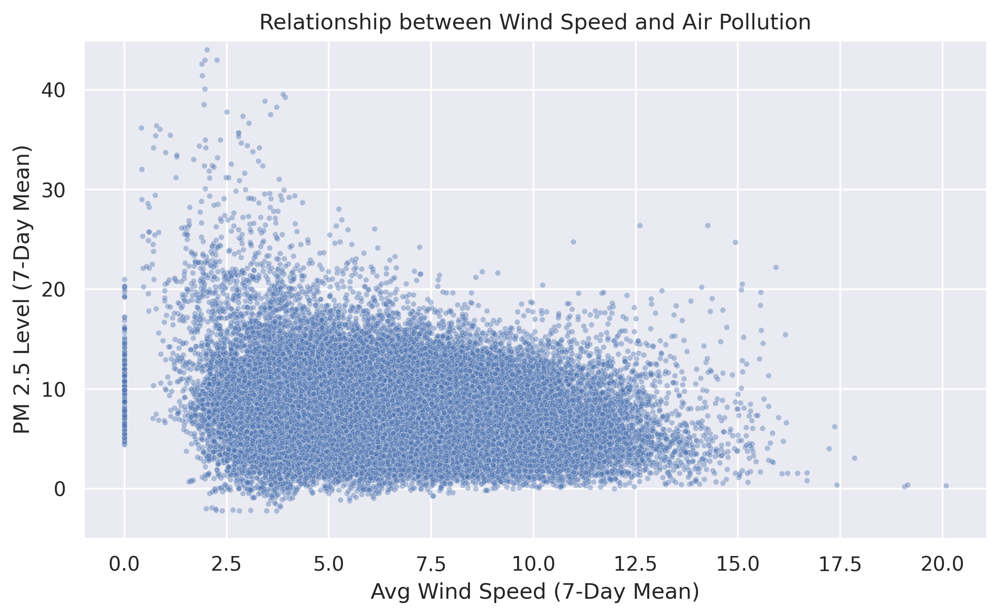

In [31]:
fig, ax = plt.subplots(figsize = (9,5))
sns.scatterplot(rel_noaa_avg, x = "avg_wdsp", y = "avg_pm25", alpha = 0.4, s = 10)
plt.xlabel("Avg Wind Speed (7-Day Mean)")
plt.ylabel("PM 2.5 Level (7-Day Mean)")
plt.title("Relationship between Wind Speed and Air Pollution")
plt.ylim(-5, 45)
plt.show()
# Correlation = -0.202

The plots above are zoomed in to focus on the general trends. Our smoothing operation seems to reduce the effect of most outliers.

There is a positive correlation between pressure and PM2.5 as well as a (arguably clearer) negative correlation between wind speed and PM2.5.


## Section 3.4 Miscellianous Queries (Avgeek Edition)

Questions in this section are not directly related to our central research questions. However, certain queries are selected to provide insight on our casual data digging.

### 3.4.1 The most popular flight routes Pre- and Post-Pandemic

Compare the most popular flight routes (Top 3) performed by the following major US-based airlines (with the attached `carrier_id`):

* `AS` - Alaska Airlines
* `AA` - American Airlines
* `DL` - Delta Air Lines
* `F9` - Frontier Airlines
* `HA` - Hawaiian Airlines
* `B6` - JetBlue Airways
* `UA` - United Air Lines
* `WN` - Southwest Airlines
* `NK` - Spirit Airlines

2019 will be selected as the pre-pandemic study year and 2024 will be selected as the post-pandemic study year. Ranking Ties will be broken arbitrarily, and we will treat (A to B) and (B to A) as separate routes.

In [32]:
%%bigquery --project $project_id
/*
Top Routes for US carriers pre and post pandemic.

Key Tools: CTE, Window Functions

Estimated Quota: 355 MB
*/

-- Perform some data pre-filtering and Aggregate by month
WITH flights_prefilter AS(
  SELECT year, carrier, origin, dest, SUM(passengers) as passengers
  FROM cs145-474518.cs145_project_main.t100
  WHERE carrier_id IN ("AA", "AS", "B6", "DL", "F9", "HA", "NK", "UA", "WN")
    AND year IN (2019, 2024) -- Pre and Post Pandemic Years
    AND passengers > 0 -- Only counting passenger flights
    GROUP BY carrier_id, carrier, origin, dest, year
),
-- Ranking the routes, ties broken arbitrarily
rt_rank AS(
  SELECT year, carrier, origin, dest, passengers,
  ROW_NUMBER() OVER (PARTITION BY year, carrier ORDER BY passengers DESC) as ranking
  FROM flights_prefilter
),
-- Select the top routes
rt_top AS(
  SELECT year, carrier, CONCAT(origin, " - ", dest) AS route, passengers, ranking
  FROM rt_rank
  WHERE ranking <= 3
)
-- Display the Results (2019 and 2024 together)
SELECT pre.carrier, pre.ranking,
  pre.route AS rt_2019, pre.passengers AS pax_2019,
  post.route AS rt_2023, post.passengers AS pax_2023
FROM (SELECT * FROM rt_top WHERE year = 2019) pre
  JOIN (SELECT * FROM rt_top WHERE year = 2024) post
    ON pre.carrier = post.carrier AND pre.ranking = post.ranking
ORDER BY pre.carrier, pre.ranking ASC

Query is running:   0%|          |

Downloading:   0%|          |

,carrier,ranking,rt_2019,pax_2019,rt_2023,pax_2023
0,Alaska Airlines Inc.,1,SEA - ANC,829575.0,SEA - ANC,804025.0
1,Alaska Airlines Inc.,2,ANC - SEA,822667.0,ANC - SEA,802124.0
2,Alaska Airlines Inc.,3,LAX - SEA,652580.0,SEA - LAX,496782.0
3,American Airlines Inc.,1,DFW - LAX,897315.0,DFW - LAX,827920.0
4,American Airlines Inc.,2,LAX - DFW,882398.0,LAX - DFW,826234.0
5,American Airlines Inc.,3,DFW - ORD,760411.0,DFW - PHX,719848.0
6,Delta Air Lines Inc.,1,MCO - ATL,1079563.0,ATL - MCO,997713.0
7,Delta Air Lines Inc.,2,ATL - MCO,1075584.0,MCO - ATL,985341.0
8,Delta Air Lines Inc.,3,LGA - ATL,826993.0,TPA - ATL,764847.0
9,Frontier Airlines Inc.,1,DEN - LAS,219129.0,LAS - DEN,301778.0


Interestingly, the most popular routes mostly remain unchanged after the pandemic for most carriers, and such routes almost always involve a carrier's main operating base. (eg. American at `DFW`, United at `SFO` & `EWR`, Delta at `ATL`, Alaska at `SEA` & `ANC`, Hawaiian at `HNL` etc.) The only airline with significant change in popular routes is Southwest, which is also the only airline that operate under a "rolling hub" model.

Additionally, passenger counts of the most popular routes decreased for most carriers featured on this list, except for Frontier and Spirit, the only Low Cost Carriers (LCC) featured on this list.

### 3.4.2 Busiest Ports of Entry

Now we will investigate the busiest ports of entry (by total inbound international traffic) in the post-pandemic world. For each entry airport, we also wish to investigate the passenger flow: What are the most common international origin for inbound traffic at these airports?

We will only use passenger flights from 2021 to 2024 in this study. Ties will be included and outputs will be limited to top-5 US airports by inbound international traffic and top-10 international origins for each airport.

In [33]:
%%bigquery --project $project_id
/*
Top inbound international routes at busiest ports of entry in the US.

Key Tools: CTE, Window Functions, RANK and DENSE_RANK use cases

Estimated Quota: 171 MB
*/

-- Perform some data pre-filtering and Aggregate by route
WITH flights_prefilter AS(
  SELECT origin, dest, SUM(passengers) as passengers
  FROM cs145-474518.cs145_project_main.t100
  WHERE year >= 2021
    AND year <  2025
    AND passengers > 0 -- Only counting passenger flights
    GROUP BY origin, dest
),
-- Filter out in-bound international flights only, count total entry
inbound_flights AS(
  SELECT f.origin, f.dest, f.passengers, ad.name AS entry_airport,
  SUM(f.passengers) OVER (PARTITION BY f.dest) AS entry_count
  FROM flights_prefilter f
    LEFT JOIN cs145-474518.cs145_project_main.airport_lookup ao
      ON f.origin = ao.code
    LEFT JOIN cs145-474518.cs145_project_main.airport_lookup ad
      ON f.dest = ad.code
  WHERE ao.country IS NULL -- origin: non US (our lookup only has US airports)
    AND ad.country =  "US" -- dest: US
),
-- Assign ranks and format airport names
-- Needs dense rank for port rank since each port has multiple rows
ranked_entries AS(
  SELECT CONCAT("[", dest, "] ", entry_airport) AS entry,
    origin, passengers,
    DENSE_RANK() OVER (ORDER BY entry_count DESC) as port_rank,
    RANK() OVER (PARTITION BY dest ORDER BY passengers DESC) as rt_rank
  FROM inbound_flights
)
-- Display Top Results
SELECT entry, origin, passengers
FROM ranked_entries
WHERE port_rank <= 5 AND rt_rank <= 10
ORDER BY port_rank ASC, rt_rank ASC

Query is running:   0%|          |

Downloading:   0%|          |

,entry,origin,passengers
0,[JFK] John F Kennedy Intl,LHR,4433270.0
1,[JFK] John F Kennedy Intl,CDG,2729398.0
2,[JFK] John F Kennedy Intl,STI,1961872.0
3,[JFK] John F Kennedy Intl,SDQ,1838058.0
4,[JFK] John F Kennedy Intl,FCO,1472169.0
5,[JFK] John F Kennedy Intl,AMS,1361919.0
6,[JFK] John F Kennedy Intl,CUN,1354850.0
7,[JFK] John F Kennedy Intl,MXP,1323389.0
8,[JFK] John F Kennedy Intl,MAD,1316125.0
9,[JFK] John F Kennedy Intl,MEX,1296461.0


The busiest ports of entry for the US are `JFK` (New York City), `MIA` (Miami), `LAX` (Los Angeles), `EWR` (Newark / NYC), and `SFO` (San Francisco).

The top origins for inbound international routes terminating at `SFO` are:  
* `LHR` - London (UK)
* `TPE` - Taipei (Taiwan)
* `YVR` - Vancouver (Canada)
* `ICN` - Seoul (Korea)
* `FRA` - Frankfurt (Germany)
* `YYZ` - Toronto (Canada)
* `SIN` - Singapore
* `MEX` - Mexico City (Mexico)
* `NRT` - Tokyo (Japan)$^1$
* `CDG` - Paris (France)

 Do note that most of these flights to `SFO` originate from large economic centers (thus aimed primarily at business travelers)$^2$, while a couple of popular routes at `MIA` and `EWR` are from leisure destinations.

Notes:
1. One team member insists that Tokyo Narita is **NOT** a Tokyo Airport. (Requires ~45 Minutes train ride to Ueno Stn. in central Tokyo)
2. From one team member's experience, international / trans-pacific flights to `SFO` are about 10 - 25% more expensive than flights to `LAX` from the same origin, despite the fact that trans-pacific flights to `LAX` need to cover a bit more distance.

---

# Section 4: Machine Learning - Predicting Air Pollution from Weather Features

---

## Section 4.1: Dataset Preparation

The following query was used to generate the training and test dataset used by our ML prediction models. The query combines multiple ideas in **Section 3**: It extracts weather features and performs smoothing on the NOAA data and flags the days with hazardous pollutant levels as the label using the EPA dataset.

Our baseline studies covers all of our 382 counties with sufficient EPA data and years 2015 to 2019.
 * 2015-01-01 to 2018-12-31 - Training Set
 * 2019-01-01 to 2019-12-31 - Validation Set
 * Min, Avg, Max Temperatures, Pressure, Wind Speed - Continuous Features
 * Rain, Fog, Thunder - Binary Features
 * Hazardous Pollution Level - Binary Label

In [ ]:
%%bigquery --project $project_id
/*
Creating the dataset for ML classification.
This query has been commented out to conserve quota.

Estimated Quota: Varies depending on date range. ~ 3.5GB for training set.
*/

/*
-- Change the table name for train / test set.
CREATE OR REPLACE TABLE cs145-474518.cs145_project_main.ml_test AS (

-- Extract and pre-process NOAA data
WITH cty_days AS(
  SELECT f.fips, d.date_local
  FROM `cs145-474518.cs145_project_main.epa_key_county` f
  CROSS JOIN (
  SELECT *
  FROM UNNEST (GENERATE_DATE_ARRAY('2019-01-01', '2019-12-31', INTERVAL 1 DAY)) as date_local
  -- Don't forget to change begin and end dates here!
) d
),
-- Extract all epa key pollutants
pm AS(
  SELECT CONCAT(state_code, county_code) as fips,
    date_local,
    AVG(arithmetic_mean) as pm_agg
  FROM bigquery-public-data.epa_historical_air_quality.pm25_frm_daily_summary
  WHERE pollutant_standard = "PM25 24-hour 2012"
  GROUP BY date_local, state_code, county_code
),
co AS(
  SELECT CONCAT(state_code, county_code) as fips,
    date_local,
    AVG(arithmetic_mean) as co_agg
  FROM bigquery-public-data.epa_historical_air_quality.co_daily_summary
  WHERE pollutant_standard = "CO 8-hour 1971"
 GROUP BY date_local, state_code, county_code
),
-- max aggregation for O3, NO2 and SO2
o3 AS(
  SELECT CONCAT(state_code, county_code) as fips,
    date_local,
    MAX(first_max_value) as o3_agg
  FROM bigquery-public-data.epa_historical_air_quality.o3_daily_summary
  WHERE pollutant_standard = "Ozone 8-hour 2015"
  GROUP BY date_local, state_code, county_code
),
no2 AS(
  SELECT CONCAT(state_code, county_code) as fips,
    date_local,
    MAX(first_max_value) as no2_agg
  FROM bigquery-public-data.epa_historical_air_quality.no2_daily_summary
  WHERE pollutant_standard = "NO2 1-hour 2010"
  GROUP BY date_local, state_code, county_code
),
so2 AS(
  SELECT CONCAT(state_code, county_code) as fips,
    date_local,
    MAX(first_max_value) as so2_agg
  FROM bigquery-public-data.epa_historical_air_quality.so2_daily_summary
  WHERE pollutant_standard = "SO2 1-hour 2010"
  GROUP BY date_local, state_code, county_code
),
-- JOIN everything for EPA
epa_extract AS(
  SELECT cty.fips, cty.date_local,
  IFNULL(p.pm_agg,0) as pm,
  IFNULL(c.co_agg,0) as co,
  IFNULL(o.o3_agg,0) as o3,
  IFNULL(n.no2_agg,0) as no2,
  IFNULL(s.so2_agg,0) as so2
  FROM cty_days cty
    LEFT JOIN pm  p ON p.fips = cty.fips AND p.date_local = cty.date_local
    LEFT JOIN co  c ON c.fips = cty.fips AND c.date_local = cty.date_local
    LEFT JOIN o3  o ON o.fips = cty.fips AND o.date_local = cty.date_local
    LEFT JOIN no2 n ON n.fips = cty.fips AND n.date_local = cty.date_local
    LEFT JOIN so2 s ON s.fips = cty.fips AND s.date_local = cty.date_local
),
-- Compute hazard days for EPA
epa_labels AS(
  SELECT fips, date_local,
  IF(pm >= 35.5 OR co >= 9.5 OR so2 > 75.0 OR no2 > 100.0 OR o3 > 0.070, 1, 0) as hazard -- hazard binary label
  FROM epa_extract
),
-- Now work on the NOAA side
noaa_extract AS(
  SELECT
    stn, wban,  DATE(CONCAT(year, "-", mo, "-", da)) as date_local, -- Station / Date
    t.temp as avg_temp, t.min as min_temp, t.max as max_temp, -- Temperature Features
    SAFE_CAST(wdsp AS FLOAT64) as wind, (slp - 1013.25) as pressure,
    -- Wind and Pressure (Pressure is shifted wrt standard atm pressure)
    IF(prcp > 0.0 AND prcp < 99.00, 1, 0) as rain_flag,
    IF(fog IN ('1'), 1, 0) as fog_flag,
    IF(thunder IN ('1'), 1, 0) as thunder_flag
  FROM `bigquery-public-data.noaa_gsod.gsod*` t
  WHERE _TABLE_SUFFIX = "2019"
    -- Change the begin and end year bound here!
    -- Ensures no bad measurement
    AND t.temp < 999.0 AND t.min < 999.0 AND t.max < 999.0
    AND SAFE_CAST(wdsp AS FLOAT64) < 999.0 AND slp < 9999.0
),
-- Create county-level features
noaa_features AS(
  SELECT l.fips, n.date_local,
      AVG(avg_temp) as avg_temp, MIN(min_temp) as min_temp, MAX(max_temp) as max_temp,
      -- Aggregate each temp measurement appropriately
      AVG(wind) as wind, AVG(pressure) as pressure,
      MAX(rain_flag) as rain_flag, MAX(fog_flag) as fog_flag,
      MAX(thunder_flag) as thunder_flag -- Use OR logic for all flags
    FROM noaa_extract n
      JOIN cs145-474518.cs145_project_main.noaa_lookup l
      ON n.stn = l.stn AND n.wban = l.wban
      -- Group by county-day pairs, average measurements
    GROUP BY l.fips, n.date_local
),
-- Associate features and labels
cty_joined AS(
  SELECT epa.fips, epa.date_local, epa.hazard,
         noaa.avg_temp, noaa.min_temp, noaa.max_temp, noaa.wind, noaa.pressure,
         noaa.rain_flag, noaa.fog_flag, noaa.thunder_flag
  FROM noaa_features noaa
  JOIN epa_labels epa
    ON epa.date_local = noaa.date_local AND epa.fips = noaa.fips
)
-- Apply moving average to all non-flag features
SELECT fips, date_local,
-- Binary Label
    hazard,
-- Binary Features
    rain_flag as rain, fog_flag as fog, thunder_flag as thunder,
-- Numerical Features
    AVG(avg_temp) OVER(PARTITION BY fips ORDER BY date_local ROWS BETWEEN 3 PRECEDING AND 3 FOLLOWING) as avg_temp,
    AVG(min_temp) OVER(PARTITION BY fips ORDER BY date_local ROWS BETWEEN 3 PRECEDING AND 3 FOLLOWING) as min_temp,
    AVG(max_temp) OVER(PARTITION BY fips ORDER BY date_local ROWS BETWEEN 3 PRECEDING AND 3 FOLLOWING) as max_temp,
    AVG(wind) OVER(PARTITION BY fips ORDER BY date_local ROWS BETWEEN 3 PRECEDING AND 3 FOLLOWING) as wind,
    AVG(pressure) OVER(PARTITION BY fips ORDER BY date_local ROWS BETWEEN 3 PRECEDING AND 3 FOLLOWING) as pressure,
FROM cty_joined

)
*/


## Section 4.2: Logistic Regression Classifier [Baseline]

We start by training a simple logistic regression model as the baseline. However, the poor performance of this model revealed a significant issue in our ML dataset: **Class Label Imbalance**.

| Table & Total Rows | # Positive Labels (\%) | # Negative Labels (\%) |
| --- | --- | --- |
| Train: 396,098 | 8,467 (2.1%) | 387,631 (97.8%) |
| Valid: 100,820 | 1,296 (1.3%) | 99,524 (98.7%) |

In [ ]:
"""
/*
ML Training code will be commented out to conserve quota.
Some of these models will take quite a bit of time to train.
*/

CREATE OR REPLACE MODEL `cs145_project_main.hazard_classification_model`
OPTIONS(model_type='LOGISTIC_REG', input_label_cols=['hazard']) AS
SELECT
  hazard,  -- Target
  avg_temp, min_temp, max_temp, wind, pressure, rain, fog, thunder -- Features
FROM `cs145-474518.cs145_project_main.ml_train`
"""

In [34]:
%%bigquery --project $project_id
/*
Baseline Model: Training Stats
*/

SELECT *
FROM ML.EVALUATE(MODEL `cs145_project_main.hazard_classification_model`
, (
  SELECT
    hazard, -- Target
    avg_temp, min_temp, max_temp, wind, pressure, rain, fog, thunder  -- Features
  FROM `cs145-474518.cs145_project_main.ml_train`
))

Query is running:   0%|          |

Downloading:   0%|          |

,precision,recall,accuracy,f1_score,log_loss,roc_auc
0,0.0,0.0,0.978589,0.0,0.084661,0.846067


In [35]:
%%bigquery --project $project_id
/*
Baseline Model: Validation Stats
*/

SELECT *
FROM ML.EVALUATE(MODEL `cs145_project_main.hazard_classification_model`
, (
  SELECT
    hazard, -- Target
    avg_temp, min_temp, max_temp, wind, pressure, rain, fog, thunder  -- Features
  FROM `cs145-474518.cs145_project_main.ml_test`
))

Query is running:   0%|          |

Downloading:   0%|          |

,precision,recall,accuracy,f1_score,log_loss,roc_auc
0,0.0,0.0,0.987135,0.0,0.061652,0.836125



Note that the accuracy of this model, though very high, perfectly aligns with the fraction of negative labels in our dataset, and the model has 0 precision and recall on both the training data and validation data. This means that our model **failed to learn anything about the relationship between weather and air pollution hazards and simply cheated the loss by always predicting 0.**

We will experiment with the following strategies to mitigate the problem of class imbalances:
  1. Penalize the model more heavily when it produces a False Negative during training. (Compared to False Positives)
  2. Employ a more flexible model and add temporal features to exploit the seasonal trends.
  3. Use a subset of the data and focus on a geographical region to minimize the interference of geography on the relationship.

## Section 4.3: XGBoost Classifier

As an improvement over the baseline logistic regression model, we have implemented a Boosted Tree Classifier in BigQuery by incorporating the first two ideas.

In [ ]:
"""
/*
XGBoost Models with Hyperparameter Selection and Recall Penalty.
Add "WHERE STARTS_WITH(fips, "06")" For the California Model
*/

CREATE OR REPLACE MODEL `cs145_project_main.hazard_xgboost_model_all`
OPTIONS(
  model_type='BOOSTED_TREE_CLASSIFIER',
  input_label_cols=['hazard'],

  -- handling the imbalance in hazard
  auto_class_weights=TRUE,
  min_tree_child_weight=5,  -- prevents minority class overfitting

  -- Hyperparameter Tuning
  num_trials=10,
  max_parallel_trials=4,
  hparam_tuning_objectives=['RECALL'],

  -- Tuning ranges
  learn_rate = HPARAM_RANGE(0.01, 0.3),
  max_tree_depth = HPARAM_RANGE(3, 8),
  subsample = HPARAM_RANGE(0.7, 1.0),
  l1_reg = HPARAM_RANGE(0.0, 1.0),
  l2_reg = HPARAM_RANGE(0.0, 1.0),

  -- boosting params
  num_parallel_tree=1,

  -- Early stopping
  early_stop=TRUE,
  min_rel_progress=0.01,
  max_iterations=100,

  tree_method='HIST',
  colsample_bytree=0.8,
  data_split_method='AUTO_SPLIT'

) AS
SELECT
  hazard,   -- Target
  avg_temp, min_temp, max_temp, wind, pressure, rain, fog, thunder, EXTRACT(MONTH FROM date_local) as month      -- Features
FROM `cs145-474518.cs145_project_main.ml_train`
"""

In [36]:
%%bigquery --project $project_id
/*
XGBoost Model: Training Stats
*/

SELECT *
FROM ML.EVALUATE(MODEL `cs145_project_main.hazard_xgboost_model_all`
, (
  SELECT
    hazard, -- Target
    avg_temp, min_temp, max_temp, wind, pressure, rain, fog, thunder,
    EXTRACT(MONTH FROM date_local) as month
  FROM `cs145-474518.cs145_project_main.ml_train`
))

Query is running:   0%|          |

Downloading:   0%|          |

,trial_id,precision,recall,accuracy,f1_score,log_loss,roc_auc
0,3,0.089976,0.836896,0.815578,0.162484,0.396145,0.905698


In [37]:
%%bigquery --project $project_id
/*
XGBoost Model: Validation Stats
*/

SELECT *
FROM ML.EVALUATE(MODEL `cs145_project_main.hazard_xgboost_model_all`
, (
  SELECT
    hazard,
    avg_temp, min_temp, max_temp, wind, pressure, rain, fog, thunder,
    EXTRACT(MONTH FROM date_local) as month
  FROM `cs145-474518.cs145_project_main.ml_test`
))

Query is running:   0%|          |

Downloading:   0%|          |

,trial_id,precision,recall,accuracy,f1_score,log_loss,roc_auc
0,3,0.051182,0.780093,0.811278,0.096062,0.3991,0.877395


By penalizing the model for false negatives during training via the `auto_class_weights` option, our XGBoost classifier was able to learn from the limited positive examples and achieved good recall. (Not many false negatives now.) However, since there is a trade-off between precision and recall, forcing the model to minimize false negatives would increase the likelihood of false positives in our prediction, and as a result, we sacrificed quite a bit of accuracy.

## Section 4.3: Restricting Geographical Scope

Now we explore our third idea. The relationship between weather and air pollution can vary significantly in different geographical regions in the US.
Given that our models do not utilize spatial features, it is unrealistic to expect our model to grasp how geography interact with the relationship between weather and air pollution. Therefore, we shall restrict our scope to the state of California and repeat the ML analysis for Section 4.3.

We also notice that the label class balance for California data is slightly improved:

| Table & Total Rows | # Positive Labels (\%) | # Negative Labels (\%) |
| --- | --- | --- |
| Train: 45,876 | 4,313 (9.4%) | 41,563 (90.6%) |
| Valid: 11,655 | 684 (5.9%) | 10,971 (94.1%) |



In [38]:
%%bigquery --project $project_id
/*
XGBoost Model (California Only): Training Stats
*/

SELECT *
FROM ML.EVALUATE(MODEL `cs145_project_main.hazard_xgboost_model`
, (
  SELECT
    hazard, -- Target
    avg_temp, min_temp, max_temp, wind, pressure, rain, fog, thunder,
    EXTRACT(MONTH FROM date_local) as month
  FROM `cs145-474518.cs145_project_main.ml_train`
  WHERE STARTS_WITH(fips, "06")
))

Query is running:   0%|          |

Downloading:   0%|          |

,trial_id,precision,recall,accuracy,f1_score,log_loss,roc_auc
0,8,0.412962,0.889404,0.870739,0.564035,0.318753,0.948871


In [39]:
%%bigquery --project $project_id
/*
XGBoost Model (California Only): Validation Stats
*/

SELECT *
FROM ML.EVALUATE(MODEL `cs145_project_main.hazard_xgboost_model`
, (
  SELECT
    hazard, -- Target
    avg_temp, min_temp, max_temp, wind, pressure, rain, fog, thunder,
    EXTRACT(MONTH FROM date_local) as month
  FROM `cs145-474518.cs145_project_main.ml_test`
  WHERE STARTS_WITH(fips, "06")
))

Query is running:   0%|          |

Downloading:   0%|          |

,trial_id,precision,recall,accuracy,f1_score,log_loss,roc_auc
0,8,0.263804,0.817251,0.855427,0.398858,0.329018,0.922551


Compared to the same model trained on the national dataset, this model see a moderate improvement in accuracy and recall and a significant improvement in precision on both training and validation data. This means that the underlying distribution of our data for California is easier for ML models to learn that the nation-wide distribution.

However, by restricting the scope, we lost about 90% of training data. The increasing gap between training metrics and validation metrics serves as evidence of overfitting despite our regularization efforts. This is to be expected for models trained on smaller datasets.

---

# Section 5: SQL Query Analysis

We have implemented a `JOIN` simulator for IO cost computation purposes. The formula used are consistent with the CS145 Equation Sheet.

In [40]:
import numpy as np
import math
# Data Type Sizes
INT_SIZE = 4
DATE_SIZE = 4
FLOAT_SIZE = 8

class Table:
    def __init__(self, schema:dict[str, int], rows:int, page_size:int = 64 * 10 ** 6):
        """
        Initialize a Table Object

        Args:
            schema: Mapping (col_name : bytes)
            rows: Number of Rows for the table
        """
        self.schema = schema
        self.rows = rows
        self.n_bytes = sum(schema.values()) * rows
        self.n_pages = math.ceil(self.n_bytes / page_size)
        self.partitioned_keys = set()
        self.sorted_keys = set()

    # Modifying page size
    def change_page_size(self, page_size):
        self.n_pages = math.ceil(self.n_bytes / page_size)

    # For sorting and hashing flags
    def sort(self, sort_keys : set):
        self.sorted_keys = sort_keys
        self.partitioned_keys = set() # Reset partition if sorted

    def partition(self, partition_keys: set):
        self.partitioned_keys = partition_keys
        self.sorted_keys = set() # Reset sort if partitioned


def join_tables(left : Table, right:Table, join_keys: set[str], output_rows:int):
    """
    Produce the schema for the resulting table after a join

    Args:
        left: Left Table
        right: Right Table
        join_keys: Keys to join on. Must be presented in the schema for both tables
        output_rows: Number of output rows
    """
    # Produce the schema for the joined table
    sche_joined = dict()
    # First check all join keys:
    for k in join_keys:
        try:
            v1 , v2 = left.schema[k], right.schema[k]
            if v1 != v2:
                raise RuntimeError(f"Table Not Joinable: Key {k} has incompatible datatypes.")
            sche_joined[k] = v1
        except ValueError:
            raise RuntimeError(f"Table Not Joinable: {k} not found.")
    # Then check all keys in left:
    for k, v in left.schema.items():
        if k in join_keys or k in sche_joined: continue
        sche_joined[k] = v
    # Check all keys in right:
    for k, v in right.schema.items():
        if k in join_keys or k in sche_joined: continue
        sche_joined[k] = v
    # Return the new table
    return Table(sche_joined, output_rows)

class CostEvaluator:
    def __init__(self, ram_size, cost_read, cost_write):
        self.b = ram_size
        self.cr = cost_read
        self.cw = cost_write

    def hash_partition(self, t:Table, keys:set):
        # mark the table as hashed
        t.partition(keys)
        return (self.cr + self.cw) * t.n_pages

    def big_sort(self, t:Table, keys:set):
        # mark the table as sorted
        t.sort(keys)
        # Do the sorting cost computation
        n_runs = max(1, t.n_pages/(2 * self.b))
        n_levels = math.ceil(math.log(n_runs))
        return (self.cr + self.cw) * (1 + n_levels) * t.n_pages

    def BNLJ(self, left:Table, right:Table, join_keys: set[str], output_rows:int):
        n_outer = min(left.n_pages, right.n_pages)
        n_inner = max(left.n_pages, right.n_pages)
        joined = join_tables(left, right, join_keys, output_rows)
        cost = self.cr * (n_outer + n_inner * math.ceil(n_outer / self.b))
        cost += self.cw * joined.n_pages
        return(joined, cost)

    def SMJ(self, left:Table, right:Table, join_keys: set[str], output_rows:int):
        cost = 0
        # Sort the tables if necessary
        if left.sorted_keys != join_keys:
            cost += self.big_sort(left, join_keys)
        if right.sorted_keys != join_keys:
            cost += self.big_sort(right, join_keys)

        # Compute the Merge Cost
        cost += self.cr * (left.n_pages + right.n_pages)
        # Compute the joined table, maintain sorted keys
        joined = join_tables(left, right, join_keys, output_rows)
        joined.sort(join_keys)
        cost += self.cw * joined.n_pages
        return (joined, cost)

    def HPJ(self, left:Table, right:Table, join_keys: set[str], output_rows:int):
        cost = 0
        # Hash the tables if necessary
        if left.partitioned_keys != join_keys:
            cost += self.hash_partition(left, join_keys)
        if right.partitioned_keys != join_keys:
            cost += self.hash_partition(right, join_keys)
        # Hash Partition Join Cost
        cost += self.cr * (left.n_pages + right.n_pages)
        # Compute the joined table, maintain partitioned keys
        joined = join_tables(left, right, join_keys, output_rows)
        joined.partition(join_keys)
        cost += self.cw * joined.n_pages
        return(joined, cost)

def multi_join(join_fn, table_list:list[Table], join_keys:set[str], out_size:int):
    """
    Perform multiple joins and compute the cost. Assumes constant output rows
    Args:
        join_fn: Join Function to be used: BNLJ/SMJ/HPJ
    """
    if len(table_list) < 2:
        print("Nothing to Join...")
        return
    result = table_list[0]
    total_cost = 0
    for i in range(1, len(table_list)):
        (result, cost) = join_fn(result, table_list[i], join_keys, out_size)
        total_cost += cost
    print(f"Total Cost for {len(table_list) - 1} {join_fn.__name__} joins:", end = "")
    print(f"{total_cost}" if total_cost < 100000 else f"{total_cost:.3e}")
    return result, total_cost


## Section 5.1: Too Many `JOIN`'s

We will study the query we used to compute the average number of monthly hazardous days for our counties of interest. The abridged version of our query will be provided below.

In [ ]:
"""
WITH relevant_cty_days AS(
  ... Generate (county, date_local) ...
),
pm AS(
  SELECT fips, date_local, AVG(arithmetic_mean) as pm_agg
  ... Data Processing on EPA PM2.5 Table ...
),
co AS(
  SELECT fips, date_local, AVG(arithmetic_mean) as co_agg
  ... Data Processing on EPA CO Table ...
),
o3 AS(
  SELECT fips, date_local, AVG(arithmetic_mean) as o3_agg
  ... Data Processing on EPA O3 Table ...
),
no2 AS(
  SELECT fips, date_local, AVG(arithmetic_mean) as no2_agg
  ... Data Processing on EPA NO2 Table ...
),
so2 AS(
  SELECT fips, date_local, AVG(arithmetic_mean) as so2_agg
  ... Data Processing on EPA SO2 Table ...
),
-- Join all records together. NULL here indicate missing values.
all_records AS(
  SELECT cty.fips, cty.date_local, p.pm_agg, c.co_agg, o.o3_agg, n.no2_agg, s.so2_agg
  FROM relevant_cty_days cty
    LEFT JOIN pm  p ON p.fips = cty.fips AND p.date_local = cty.date_local
    LEFT JOIN co  c ON c.fips = cty.fips AND c.date_local = cty.date_local
    LEFT JOIN o3  o ON o.fips = cty.fips AND o.date_local = cty.date_local
    LEFT JOIN no2 n ON n.fips = cty.fips AND n.date_local = cty.date_local
    LEFT JOIN so2 s ON s.fips = cty.fips AND s.date_local = cty.date_local
),
cty_hazardous_days AS(
  ... Fill in the NULL values in the JOIN'd table with 0's ...
  ... Create a binary variable hazard_flag based on pollutant levels ...
),
-- Group By Month, Then Average Across Years
cty_monthly_h_count AS(
  SELECT fips, EXTRACT(YEAR FROM date_local) as year, EXTRACT(MONTH FROM date_local) as month,
    SUM(hazard_flag) as h_days
  FROM cty_hazardous_days
  GROUP BY fips, EXTRACT(YEAR FROM date_local), EXTRACT(MONTH FROM date_local)
),
cty_monthly_avg_count AS(
  SELECT fips, month, ROUND(AVG(h_days), 3) AS haz_days
  FROM cty_monthly_h_count
  GROUP BY fips, month
)
-- Display the Result with State Names
SELECT l.fips, r.state_name, r.county_name, l.month, l.haz_days
FROM cty_monthly_avg_count l
  JOIN `cs145-474518.cs145_project_main.county_fips` r
    ON l.fips = r.fips
ORDER BY l.haz_days DESC
LIMIT 10
"""

Attached below is the BigQuery query plan schematics.

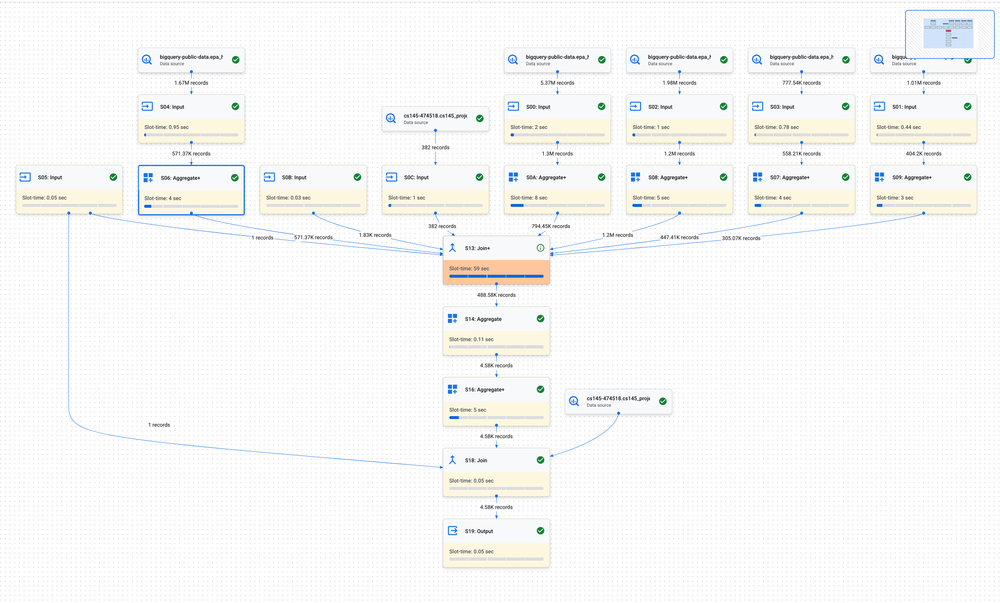

The stages featured in the schematic are also explained below:

| Stage Number | What it does | Rows Read | Rows Written | Slot Time |
| --- | --- | --- | --- | --- |
| S00, S0A | Process (Filter + Agg) PM 2.5 Table | 5.37 M | 794.5 K | 10 Sec |
| S01, S09 | Process (Filter + Agg) CO Table | 1.01 M | 305.1 K | 3.5 Sec |
| S02, S08 | Process (Filter + Agg) O3 Table | 1.98 M | 1.2 M | 6 Sec |
| S03, S07 | Process (Filter + Agg) NO2 Table | 777.5 K | 447.4 K | 5 Sec |
| S04, S06 | Process (Filter + Agg) SO2 Table | 1.67 M | 571.4 K | 5 Sec |
| S0B, S0C | Read County and Date Lists | 382 & 1826 | 382 & 1826 | 1 Sec |
| S13 | Cross Join (County, Date) then Left Join with (PM 2.5, CO, O3, NO2, SO2) | 133 M | 488.6 K | **59 Sec** |
| S14 | Aggregate in CTE `cty_monthly_h_count` | 488.6 K | 4584 | 0.1 Sec |
| S16 | Aggregate in CTE `cty_monthly_avg_count` | 4584 | 4584 | 5 Sec |
| S18 | Final `JOIN` in output | 7724 | 4584 | 0 Sec |

The clear bottleneck in this query is `S13`, corresponding to the multiple `LEFT JOIN`s in CTE `all_records`. Let's analyze this join in detail. To compute the IO cost of this `JOIN` using our cost models, we shall make the following simplifying assumptions, which might be different from how BigQuery implements things.

* The `CROSS JOIN` outputs a Table with 1826 $\cdot$ 382 = 697,532 rows, which will be the output row count for all subsequent `LEFT JOIN`s. The cost of `CROSS JOIN` is the same for all join algorithms.
* The tables produced by `S06, S07, S08, S09, S0A` **Do Not** have duplicates on the `JOIN` keys `fips, date_local`. (Ensured to be distinct by the `GROUP BY` aggregates.)
* `S06, S07, S08, S09, S0A` only contain 3 columns: `fips, date_local` and aggregated measurement.
* `date_local` date values are represented as 32-bit integers 4 bytes per row.
* `fips` codes are stored as 32-bit integers: 4 bytes per row.
* All aggregated measurements from the EPA tables are stored as double-precision floating point numbers: 8 bytes per row.
* Joins will be performed sequentially, and the sortedness / partition of the output table of a previous join can be exploited when joining the next table.

 Assume $C_r = C_w = 1$. We have attached the python code that simulates the `JOIN` process and performs the cost calculation. On a real system with a page size of 64 MB and a RAM size of 50 Pages (3.2 GB) then the cost of all `JOIN` algorithms are negligible and Block Nested Loop Join has the lowest cost. We shall simulate this `JOIN` with different dataset scales:

In [41]:
evaluator = CostEvaluator(50, 1, 10)
# Page Size
p_size = 64 * 10 ** 6

def simulate_with_scale(s):
    print(f"Simulating with scale {s}x...")
    out_rows = 697532 * s
    # Register the Tables
    S06 = Table({"fips":INT_SIZE, "date_local":DATE_SIZE, "so2":FLOAT_SIZE}, 571369 * s,p_size)
    S07 = Table({"fips":INT_SIZE, "date_local":DATE_SIZE, "no2":FLOAT_SIZE}, 447414 * s,p_size)
    S08 = Table({"fips":INT_SIZE, "date_local":DATE_SIZE, "o3":FLOAT_SIZE}, 1196096 * s,p_size)
    S09 = Table({"fips":INT_SIZE, "date_local":DATE_SIZE, "co":FLOAT_SIZE}, 305068 * s,p_size)
    S0A = Table({"fips":INT_SIZE, "date_local":DATE_SIZE, "pm":FLOAT_SIZE}, 794447 * s,p_size)
    S0C = Table({"fips":INT_SIZE, "date_local":DATE_SIZE}, out_rows, p_size)
    all_tables = [S0C, S0A, S09, S08, S07, S06]

    multi_join(evaluator.BNLJ, all_tables, {"fips", "date_local"}, out_rows)
    multi_join(evaluator.SMJ, all_tables, {"fips", "date_local"}, out_rows)
    multi_join(evaluator.HPJ, all_tables, {"fips", "date_local"}, out_rows)
    print("")

scales = [1, 10, 100, 1000, 10**6, 10**9]
for s in scales: simulate_with_scale(s)

Simulating with scale 1x...
Total Cost for 5 BNLJ joins:60
Total Cost for 5 SMJ joins:126
Total Cost for 5 HPJ joins:126

Simulating with scale 10x...
Total Cost for 5 BNLJ joins:225
Total Cost for 5 SMJ joins:346
Total Cost for 5 HPJ joins:346

Simulating with scale 100x...
Total Cost for 5 BNLJ joins:1988
Total Cost for 5 SMJ joins:3022
Total Cost for 5 HPJ joins:3022

Simulating with scale 1000x...
Total Cost for 5 BNLJ joins:23045
Total Cost for 5 SMJ joins:41304
Total Cost for 5 HPJ joins:29710

Simulating with scale 1000000x...
Total Cost for 5 BNLJ joins:4.221e+09
Total Cost for 5 SMJ joins:1.117e+08
Total Cost for 5 HPJ joins:2.965e+07

Simulating with scale 1000000000x...
Total Cost for 5 BNLJ joins:4.202e+15
Total Cost for 5 SMJ joins:1.777e+11
Total Cost for 5 HPJ joins:2.965e+10



By tweaking the simulation scales, RAM sizes, and single IO costs, we obtain the following cost tables:

<table>
<tr><th> 50 Pgs (3.2GB), $C_r = 1$, $C_w = 1$ </th><th> 200 Pgs (12.8GB),$C_r = 1$, $C_w = 1$ </th><th> 200 Pgs (12.8GB),$C_r = 1$, $C_w = 10$</th></tr>
<tr><td>

| Scale | BNLJ | SMJ | HPJ |
| ---: | --- | --- | --- |
| 1    | **15** | 27 | 27 |
| 10   | **45** | 67 | 67 |
| 100  | **395** | 583 | 583 |
| 1000 | 7331 | 7833 | **5725** |
| 10 K | 453K | 118K | **57.1K**  |
| 1 M  | 4.21B | 20.6M | **5.71M** |
| 10 M | 420B | 244M | **57.1M** |
| 1 B  | Too Large | 32B | **5.71B** |

</td><td>

| Scale | BNLJ | SMJ | HPJ |
| ---: | --- | --- | --- |
| 1    | **15** | 27 | 27 |
| 10   | **45** | 67 | 67 |
| 100  | **395** | 583 | 583 |
| 1000 | **4187** | 5725 | 5725 |
| 10 K | 139K | 96.5K | **57K**  |
| 1 M  | 1.05B | 17.7M | **5.71M** |
| 10 M | 105B | 216M | **57.1M** |
| 1 B  | Too Large | 30.5B | **5.71B** |

</td><td>

| Scale | BNLJ | SMJ | HPJ |
| ---: | --- | --- | --- |
| 1    | **60** | 126 | 126 |
| 10   | **225** | 346 | 346 |
| 100  | **1988** | 3022 | 3022 |
| 1000 | **19.9k** | 29.7K | 29.7K |
| 10 K | **296K** | 513K | 297K |
| 1 M  | 1.07B | 95.6M | **29.6M** |
| 10 M | 105B | 1.17B | **296M** |
| 1 B  | Too Large | 166B | **29.6B** |

</td></tr> </table>

We see a similar pattern: BNLJ is the optimal cost solution when the scale is small, and Hash Partition Join will be the optimal cost solution if we scale up the query. However, note that the threshold which HPJ starts to take over depends on the RAM size and the write cost: The larger the RAM and the larger the write cost, the more enticing BNLJ would be compared to HPJ in moderately large scales. For larger scales, Sort Merge Join also achieves notably lower IO costs than BNLJ. However, sorting introduces an unnecessary overhead that we are not taking advantage of in the later stages of this query.

As for potential ways of optimizing the IO cost for this series of `JOIN`s, we propose the following:
1. The `CROSS JOIN` is not necessary if we are not using the time series interpolation feature. We can instead use `FULL OUTER JOIN` to ensure that we are not dropping measurement data during the join. This will save us a couple of write IOs.
2. Our `JOIN` keys (`fips, date_local`) have very high selectivity / cardinality. If this query is performed on larger scale data, we should consider building a (composite) hash index for these columns. Alternatively, a B+ Tree index could also be used if date range queries are frequently performed for analysis.
3. (Not related to the `JOIN` but could reduce IO costs during the initial processing stage.) We could partition the EPA tables by years (similar to how the NOAA tables are organized) so that it is not required to scan through the whole dataset when performing date filtering. This will reduce the IO cost during the initial filtering and aggregation part of this query.

## Section 5.2: When `BNLJ` Seems to be the Only Option...

We are also interested in studying a unique `JOIN` used in our analysis. However, even though this `JOIN` was only performed once, it was instrumental for us to relate the NOAA weather data with the EPA air quality data.

In [ ]:
'''
-- Create a lat long geography point for all US NOAA stations
  WITH noaa_stn AS(
    SELECT usaf, wban, name, ST_GEOGPOINT(lon, lat) AS latlong
    FROM `bigquery-public-data.noaa_gsod.stations`
    WHERE country = "US"
  ),
  -- Select key columns from the geo_us_boundaries table (fips, bounding box)
  county_map AS(
    SELECT county_fips_code as fips, county_geom
    FROM `bigquery-public-data.geo_us_boundaries.counties`
  )
-- Complex JOIN condition???
  SELECT l.usaf AS stn, l.wban, l.name, r.fips
  FROM noaa_stn l
    JOIN county_map r
      ON ST_CONTAINS(r.county_geom, l.latlong)
'''

Attached below is the query schematics.

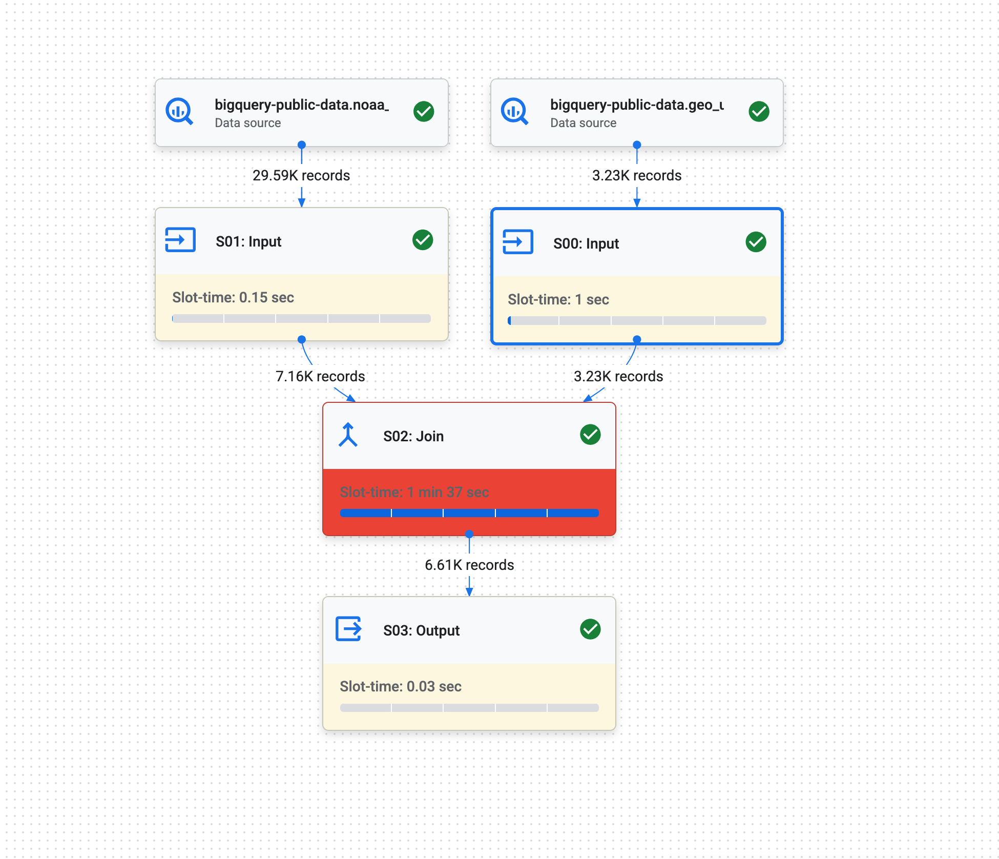

Even though this query only has 3 computation stages, it took more time to complete than the seemingly more complex query in Section 5.2:

| Stage Number | What it does | Rows Read | Rows Written | Slot Time |
| --- | --- | --- | --- | --- |
| S00 | Scan through the `geo_us_boundaries` county table | 3233 | 3233 | 1 Sec |
| S01 | Read and Filter `noaa.stations` table | 29.6 K | 7161 | 0.15 Sec |
| S02 | `JOIN` the two tables | **415,760** | 6614 | **97 Sec** |





This query provides an example where the cost of a `JOIN` is dominated by compute rather than IO operations. Since the `JOIN` condition is an example of a non-equality join, we cannot exploit sortedness to use Sort Merge Join, or exploit equality to use Hash Partition Join. In this case, Block Nested Loop Join will be the only viable option.

Let's assume that eventually `geo_us_boundaries.counties` will be the smaller, outer table in BNLJ. The table is also only about 180 MB so it should fit in RAM easily. Therefore, both computational and IO costs will scale linearly with the size of `noaa_gsod.stations`. Given what we have observed, we expect compute costs to continue dominate IO costs.

The computational inefficiency lies in the fact that `BNLJ` performs all pairwise `ST_CONTAINS` comparisons for all NOAA stations and all 3,233 coounty bounding boxes. Unlike numerical comparisons that can be completed in a couple of clock cycles, `ST_CONTAINS` is a non-trivial operation whose complexity depends on the underlying geometry of the county bounding boxes.

Therefore, a successful optimization strategy for this query must minimize the number of `ST_CONTAINS` comparison, and we propose the following possibilities:
1. Rather than using a `JOIN`, consider re-writting the query as an `EXISTS` subquery to make use of early stopping. (We expect each station to be assigned to at most one county.)
2. Consider a multi-level `JOIN` strategy: First assign the **state** containing the NOAA station, (\~50 `ST_CONTAINS` comparisons) and then only **check counties in that specific state.** (\~64 `ST_CONTAINS` comparisons) This reduces the number of comparisons from 3,233 comparisons per station to about 110 comparisons per station.

Note that we can combine the two strategies to further optimize this query, which we expect to provide a speed up of at least 30x.

---

# Section 6: Conclusion

---

This was a very fruitful data science project: we not only drafted complex SQL queries to develop data-driven insights, but also seamlessly integrated visualization and data processing tools we are familiar with into this new ecosystem.

To summarize our key findings:
* EPA's temporal coverage gap after May 2022 limits potentials for post-pandemic studies.
* Hazardous air pollutants exibit both seasonal patterns and spatial movement trends.
* There is a non-trivial relationship between poor air quality and public health challenges.
* We can predict air quality hazards using limited temporal features and weather indicators with a fairly good degree of acuracy despite some sparsity problems in the dataset.

We also explored some key database algorithms and system challenges with the real-world datasets featured in our studies:
* The choice of `JOIN` algorithm could significantly impact the overall computational complexity and IO costs of a query.
* In cases where the cost of `JOIN` is dominated by compute, there might be better alternatives.

### Limitations and Future Studies

Although this project addressed many limitation we acknowledged in Project 1, some parts of our initial research vision remain unsolved, either due to dataset problems or tool limitations.

* This project does not aim to answer **Causal Problems**. Though we have identified evidence suggesting **correlation** between air quality and other indicators, this **does not imply causal relationship between these variables.** Answering causal questions requires either manipulation through Randomized Control Trials or advanced statistical techniques to remove confounding relationships.

* Data availability problems in the EPA restricted the scope of this study to last decade, and we were not able to obtain insights about the post-pandemic world with similar levels of confidence.

* There are no publicly available air quality metrics measured directly at US airports. Associating air traffic with air quality measurements that are tens of kilometers away is not the best way to study the effect of air travel on air quality.

* We expect to further enhance the performance of our machine learning methods through a more rigorous way of hyper-parameter tuning and feature engineering. Moreover, BigQuery does not provide us with the tools needed for feature importance study: we cannot answer whether our model is learning useful patterns or is cheating the loss function through some spurious relationships.

* We can only form **intuition** about the relationships between air quality and other variables, but BigQuery does not provide the tools for rigorous statistical testing.

Possible extensions of our work include:

* Augment the EPA dataset with more recent air quality datasets to remedy the sparsity problem after the pandemic.

* Conduct more experiments with ML models offline and extract additional insights through explainable ML tools such as Shapley Values.

* Perform statistical analysis that either confirms or rejects the hypotheses formed by our intuition about the data.

### AI & LLM Disclaimer

Similar to Project 1, this project is completed with minimal assistance from Artificial Intelligence & Large Language Models. No SQL code is directly AI-generated, and most visualization are fine-tuned with human effort based on a LLM-generated skeleton.

The LLMs used to assist the completion of this project are Google Gemini 2.5 and Claude Sonnet 4.5, both made available through Stanford's AI Playground.